# Описание проекта

Отдел аналитики Яндекс.Афиши. Задача: помочь маркетологам оптимизировать маркетинговые затраты.
В распоряжении есть данные от Яндекс.Афиши с июня 2017 по конец мая 2018 года.

Изучим:

* как люди пользуются продуктом,
* когда они начинают покупать,
* сколько денег приносит каждый клиент
* когда клиент окупается.

<b> <i> План на проект</b> </i><br>

<b> <i> Шаг 1. Загрузка данных</b> </i>

<b> <i> Шаг 2. Подготовка данных к анализу</b> </i>

<b> <i> Шаг 3. Составление отчётов и расчет метрик </b> </i>

<b>Продукт</b><br>

Сколько людей пользуются в день, неделю, месяц?<br>
Сколько сессий в день?<br>
Сколько длится одна сессия?<br>
<b>Как часто люди возвращаются?</b> <br>

<b>Продажи</b><br>

Когда люди начинают покупать?<br>
Сколько раз покупают за период?<br>
Какой средний чек?<br>
Сколько денег приносят? (LTV)<br>

<b>Маркетинг</b><br>

Сколько денег потратили? Всего / на каждый источник / по времени<br>
Сколько стоило привлечение одного покупателя из каждого источника?(САС)<br>
На сколько окупились расходы? (ROI)<br>

<b> <i>Шаг 4. Общий вывод:</b> </i> рекомендация маркетологам, куда и сколько им стоит вкладывать денег?
Какие источники/платформы перспективны? На какие метрики вы ориентируетесь? Почему? Какие выводы вы сделали, узнав значение метрик?

# 1 Изучение общей информации
<a id='section1'></a> <>
[Table of content](#table_of_content)


## 1.1 Импорт библиотек и данных
<a id='libraries_import'></a> <>
[Table of content](#table_of_content)


In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import plotly.express as px
from scipy import stats as st
import seaborn as sns
from datetime import datetime
import plotly.graph_objects as go

from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')

In [2]:
visits = pd.read_csv('/Users/admin2/Desktop/2020/yandx/data/6/visits_log.csv')

In [3]:
# let's rename the columns

visits = visits.rename(columns={"Device": "device", "End Ts": "ssn_end", \
                                "Source Id": "source_id", "Start Ts":"ssn_start","Uid":"user_id"})

In [4]:
orders = pd.read_csv('/Users/admin2/Desktop/2020/yandx/data/6/orders_log.csv')

In [5]:
# let's rename the columns

orders = orders.rename(columns={"Buy Ts": "order_date", "Revenue": "revenue", "Uid": "user_id"})

In [6]:
costs = pd.read_csv('/Users/admin2/Desktop/2020/yandx/data/6/costs.csv')

In [7]:
# let's rename the columns

costs = costs.rename(columns={"dt": "date"})

### Вывод:
    Были изменены названия некоторых столбцов. Также, пропусков в пункте 1 не было выявлено, но типы данных необходимо поправить: заменить тип данных для дат, чтобы их можно было сравнивать между собой и для упрощения работы. 

# 2 Подготовка данных
<a id='section2'></a> <>
[Table of content](#table_of_content)

## Новые названия столбцов в таблицах

Таблица <b> visits </b> (лог сервера с информацией о посещениях сайта):<br>
<b>user_id</b> — уникальный идентификатор пользователя <br>
<b> device</b> — категория устройства пользователя <br>
<b> ssn_start</b> — дата и время начала сессии <br>
<b> ssn_end</b> — дата и время окончания сессии <br>
<b> source_id</b> — идентификатор рекламного источника, из которого пришел пользователь <br>

Таблица <b> orders</b> (информация о заказах):<br>
<b> user_id</b> — уникальный id пользователя, который сделал заказ<br>
<b> order_date</b> — дата и время заказа<br>
<b> revenue</b> — выручка Яндекс.Афиши с этого заказа<br>

Таблица <b> costs</b> (информация о затратах на маркетинг):<br>
<b> source_id</b> — идентификатор рекламного источника<br>
<b> date </b> — дата<br>
<b> costs </b> — затраты на этот рекламный источник в этот день<br>


# 2.1 Работа над пропусками, изменение типов данных
<a id='section2_1'></a> <>
[Table of content](#table_of_content)

In [9]:
# to datetime data type
for date_column_name in ["ssn_end", "ssn_start"]:
    visits[date_column_name] = pd.to_datetime(visits[date_column_name])

In [10]:
# checking duplicated data
visits[visits.duplicated(keep = False)].sort_values(by = visits.columns.values.tolist())

,device,ssn_end,source_id,ssn_start,user_id


In [11]:
# to datetime data type
orders['order_date'] = pd.to_datetime(orders['order_date'])

In [13]:
# checking duplicated data
orders[orders.duplicated(keep = False)].sort_values(by = orders.columns.values.tolist())

,order_date,revenue,user_id


In [14]:
# to datetime data type
costs['date'] = pd.to_datetime(costs['date'])

In [16]:
# checking duplicated data
costs[costs.duplicated(keep = False)].sort_values(by = costs.columns.values.tolist())

,source_id,date,costs


# Вывод: 
    заменили тип данных для дат и проверили таблицы на дубликаты. 

# 2.2 Проверка на выбросы
<a id='section2_2'></a> <>
[Table of content](#table_of_content)

Выбросы могут быть в orders['revenue'] (выручка Яндекс.Афиши с определенного заказа) и в costs['costs'] (затраты на рекламный источник в определенный день). Проверим.

In [17]:
orders['revenue'].describe()

count    50415.000000
mean         4.999647
std         21.818359
min          0.000000
25%          1.220000
50%          2.500000
75%          4.890000
max       2633.280000
Name: revenue, dtype: float64

In [18]:
fig = px.histogram(orders, x="revenue", marginal="box", title = 'Распределение revenue',\
                   labels={
                     "count": "Количество",
                     "revenue": "Выручка Яндекс.Афиши с заказа, у.е."                     
                 })
fig.show()

In [19]:
orders.query('revenue > 2000')

,order_date,revenue,user_id
23244,2017-12-10 20:17:00,2633.28,5539673724080479777


Посмотрим подробнее на распределение выручки. 

In [20]:
fig = px.histogram(orders.query('revenue <=20'), x="revenue", marginal="box", title = 'Распределение revenue',\
                   labels={
                     "count": "Количество",
                     "revenue": "Выручка Яндекс.Афиши с заказа, у.е."                     
                 })
fig.show()

In [21]:
print('Доля выбросов:', orders.query('revenue >= 15').shape[0] / orders.shape[0]*100, '%')

Доля выбросов: 4.15550927303382 %


### Доля данных в 4 % не критична, тем более если она смещает статистику(стандартное отклонение 21!), поэтому избавимся от нее. Мы же делаем отчет про среднестатистического опльзователя. 

In [22]:
orders_cut = orders.query('revenue <= 15')

In [23]:
orders.revenue.describe()

count    50415.000000
mean         4.999647
std         21.818359
min          0.000000
25%          1.220000
50%          2.500000
75%          4.890000
max       2633.280000
Name: revenue, dtype: float64

In [24]:
costs['costs'].describe()

count    2542.000000
mean      129.477427
std       156.296628
min         0.540000
25%        21.945000
50%        77.295000
75%       170.065000
max      1788.280000
Name: costs, dtype: float64

In [25]:
fig = px.histogram(costs, x="costs", marginal="box", title = 'Распределение costs',\
                   labels={
                     "count": "Количество",
                     "costs": "Стоимость рекламного источника, у.е."                     
                 })
fig.show()

In [26]:
print('Доля выбросов:', costs.query('costs > 400').shape[0] / costs.shape[0]*100)

Доля выбросов: 7.199055861526357


### По boxplot выбросы начинаются с 200 у.е., но 19% данных и даже 7% (для расходов более 400у.е.) лучше не резать, так как это довольно значительный объем данных.

In [27]:
print('Доля выбросов:', costs.query('costs > 500').shape[0] / costs.shape[0]*100)

Доля выбросов: 4.130605822187254


### 4% данных уже не критично. Удалим расходы на рекламу больше 500 у.е. 

In [28]:
costs_cut = costs.query('costs <= 500')

In [29]:
costs = costs.query('costs <= 1000')

## Вывод:
    В расходах и доходах часто встречаются выбросы. Так как нас интересуют выводы для среднестатистических пользователей, мы подчистили данные от аномальных значений в таблицах orders & costs. Удаляли не более 5% данных. 

# 3 Составление отчётов и расчет метрик

<a id='section3' ></a> <>
[Table of content](#table_of_content)


[3.1 Продукт](#section3_1)<br>

3.1.1 [DAU, WAU, MAU](#section3_1_1)

3.1.2 [ASL](#section3_1_2)

3.1.3 [Sticky Factor](#section3_1_3)

3.1.4 [Customer Retention Rate](#section3_1_4)
    
[3.2 Продажи](#section3_2)<br>

3.2.1 [Когда люди начинают покупать?](#section3_2_1)

3.2.2 [Когортный анализ](#section3_2_2)

3.2.3 [Анализ абсолютных показателей](#section3_2_3)

3.2.4 [Анализ относительных показателей](#section3_2_4)

3.2.5 [Изменение среднего чека](#section3_2_5)

3.2.6 [LTV](#section3_2_6)

[3.3 Маркетинг](#section3_3)<br>

3.3.1 [CAC](#section3_3_1)

3.3.2 [ROI](#section3_3_2)

3.3.3 [Окупаемость источников по устройствам](#section3_3_3)

3.3.4 [Воронки](#section3_3_4)

# 3.1 Продукт
<a id=section3_1 ></a> <>
[Table of content](#table_of_content)

Сколько людей пользуются в день, неделю, месяц?
Сколько сессий в день?
Сколько длится одна сессия?
Как часто люди возвращаются?

Таблица visits (лог сервера с информацией о посещениях сайта):
user_id — уникальный идентификатор пользователя
device — категория устройства пользователя
ssn_start — дата и время начала сессии
ssn_end — дата и время окончания сессии
source_id — идентификатор рекламного источника, из которого пришел пользователь

Для ответа на эти вопросы воспользуемся следующими метриками. 

На активных пользователей смотрят в трёх измерениях: <br>
DAU (от англ. daily active users) — количество уникальных пользователей в день;<br>
WAU (от англ. weekly active users) — количество уникальных пользователей в неделю;<br>
MAU (от англ. monthly active users) — количество уникальных пользователей в месяц.<br>

Посмотрим на среднюю продолжительность сессии (ASL) и узнаем сколько длится сессия пользователя в среднем<br>

Sticky factor (sticky factor = DAU/WAU или sticky factor = DAU/MAU). По этой метрике можно уыидеть регулярность использования вашего приложения — то, как часто пользователи к нему обращаются.
 
Чтобы узнать как часто люди возвращаются нужно вычислить Customer Retention Rate. 


#### Изучим данные пользовательской активности в приложении

In [30]:
# Чтобы посчитать недельное и месячное использование, 
# выделим в отдельные столбцы 
# год, месяц и неделю, полную дату.

visits['session_year']  = visits['ssn_start'].dt.year
visits['session_month'] = visits['ssn_start'].dt.month
visits['session_week']  = visits['ssn_start'].dt.week
visits['session_date'] = visits['ssn_start'].dt.date

# DAU
<a id=section3_1_1 ></a> <>

In [31]:
# DAU for both desktop and touch versions
dau_total = visits.groupby(['session_date']).agg({'user_id':'nunique'}).mean()
print('Daily Active Users:', int(dau_total))

Daily Active Users: 907


In [32]:
# DAU for different devices
dau_device = visits.groupby(['device', 'session_date']).agg({'user_id':'nunique'})
dau_device.groupby('device').agg({'user_id':'mean'})

,user_id
device,
desktop,659.244505
touch,252.873278


In [33]:
# DAU for different devices
desktop_dau = 659
touch_dau = 253

Посмотрим как распределено количество посетителей веб ресурса. 

In [34]:
dau_total_hist = visits.groupby('session_date').agg({'user_id':'nunique'})

Text(0, 0.5, 'Частота встречаемости значения')

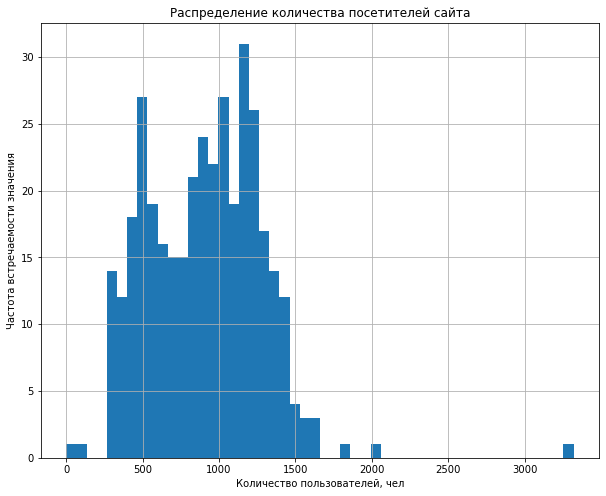

In [35]:
dau_total_hist['user_id'].hist(bins=50, figsize = (10, 8))
plt.title('Распределение количества посетителей сайта')
plt.xlabel('Количество пользователей, чел')
plt.ylabel('Частота встречаемости значения')

В какие даты пришло рекордное количество посетителей?

In [36]:
dau_total_hist[dau_total_hist['user_id'] > 1500]

,user_id
session_date,
2017-11-16,1604
2017-11-24,3319
2017-11-25,1817
2017-11-27,1571
2017-12-07,1524
2017-12-11,1505
2017-12-13,1509
2018-02-01,1640
2018-03-25,1545


In [37]:
dau_total_hist['user_id'].describe()

count     364.000000
mean      907.991758
std       370.513838
min         1.000000
25%       594.000000
50%       921.000000
75%      1173.000000
max      3319.000000
Name: user_id, dtype: float64

In [38]:
daily_ssns = visits.groupby('session_date').agg({'user_id':'count'}).mean()
print('Daily sessions:', int(daily_ssns))

Daily sessions: 987


Text(0, 0.5, 'Users quantity')

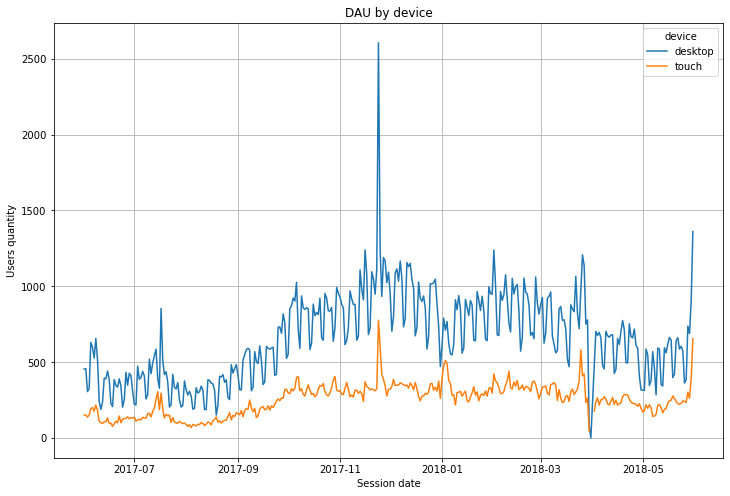

In [39]:
visits.pivot_table(index = 'session_date', columns = 'device', values = 'user_id', \
                   aggfunc = 'nunique').plot(grid = True, figsize = (12, 8))

plt.title('DAU by device')
plt.xlabel('Session date')
plt.ylabel('Users quantity')

### Вывод:
    В среднем 907 человек используют приложение ежедневно. Обычно у приложения 987 сессий в день. Всплеск активности наблюдался в ноябре 24, 25 в период черной пятницы, тогда сайт посетило рекордное количество человек (3319 п-лей). Видимо, люди активно искали события и скидки. Также, в 2018 году пользователи активизировались в марте, в период детских каникул (весенние каникулы — с 23 марта по 31 марта) и 31 мая в четверг. Видимо, в связи с началом лета и будущими продолжительными выходными. 
    Активных пользователей больще у компьютерной версии сайта.
    Я бы посмотрела среднюю продолжительность сессий на пиках, чтобы в новом году подготовиться к всплеску интереса пользователей. запомним даты: 2018-05-31, 2017-11-24.

# WAU 

In [40]:
# WAU for both desktop and touch versions
wau_total = visits.groupby('session_week').agg({'user_id':'nunique'}).mean()
print('Weekly Active Users:', int(wau_total))

Weekly Active Users: 5825


In [41]:
# WAU for different devices
wau_device = visits.groupby(['device', 'session_week']).agg({'user_id':'nunique'})
wau_device.groupby('device').agg({'user_id':'mean'})

,user_id
device,
desktop,4208.173077
touch,1666.230769


In [42]:
# WAU for different devices
desktop_wau = 4208
touch_wau = 1666

In [43]:
weekly_sessions = visits.groupby('session_week').agg({'user_id':'count'}).mean()
print('Weekly Sessions:', int(weekly_sessions))

Weekly Sessions: 6911


# MAU

In [44]:
# MAU for both desktop and touch versions
mau_total = visits.groupby('session_month').agg({'user_id':'nunique'}).mean()
print('Monthly Active Users:', int(mau_total))

Monthly Active Users: 23228


In [45]:
# MAU for different devices
mau_device = visits.groupby(['device','session_month']).agg({'user_id':('nunique')})
mau_device.groupby('device').agg({'user_id':'mean'})

,user_id
device,
desktop,16724.916667
touch,6825.916667


In [46]:
# MAU for different devices
desktop_mau = 16724
touch_mau = 6826

### Вывод:
    В среднем 907 человек используют приложение ежедневно, 5825 еженедельно и 23228 ежемесячно. Около 70% пользователей используют компьютерную версию сайта.
    Daily Active Users = 907
    Weekly Active Users = 5825
    Monthly Active Users = 23228
    

# ASL
<a id=section3_1_2 ></a> <>

Теперь мы знаем, сколько пользователей заходит в приложение. Посмотрим, сколько пользователи сидят в приложении. Узанем время 1 сессии и сколько сессий приходится на 1 пользователя ежадневно и за месяц. Сессия — набор действий пользователя, выполняемый от открытия приложения до окончания его использования.

Полезно изучить то, сколько сессий приходится на одного пользователя, например, за месяц. Это хороший показатель регулярности использования приложения.
Найти эту метрику просто — разделим число сессий на количество пользователей за период

In [47]:
# creating a table with numbers of sessions and users per month
sessions = visits.groupby(['session_year', 'session_month']).agg({'user_id':['count','nunique']})

#renaming its columns
sessions.columns = ['n_sessions', 'n_users']

In [48]:
sessions['ssns_per_user'] = sessions['n_sessions'] / sessions['n_users']

In [49]:
sessions

n_sessions  n_users  ssns_per_user
session_year session_month                                    
2017         6                   16505    13259       1.244815
             7                   17828    14183       1.256998
             8                   14355    11631       1.234202
             9                   23907    18975       1.259921
             10                  37903    29692       1.276539
             11                  43969    32797       1.340641
             12                  41983    31557       1.330386
2018         1                   36939    28716       1.286356
             2                   37182    28749       1.293332
             3                   35679    27473       1.298693
             4                   26515    21008       1.262138
             5                   26635    20701       1.286653

In [50]:
print('В среднем приходится {:.2f} сессий на 1 пользователя'.format(sessions.ssns_per_user.mean())) 

В среднем приходится 1.28 сессий на 1 пользователя


### Вывод:
    В месяц один пользователь в среднем проводит в приложении 1 сессию. Не сказать, что продукт используется регулярно. Пользователи редко возвращаются. В ноябре, зимой, марте и мае количество сессий увеличивается. 

Узнаем сколько времени пользователи проводят на сайте. Вычислим среднюю продолжительность сессии (ASL) и узнаем сколько длится сессия пользователя в среднем. Посчитаем длину всех сессий и вычислим среднее с учетом спкцифики продукта среднюю продолжительность узнаем по моде, среднему или медиане. 

In [51]:
visits['duration_sec'] = (visits['ssn_end'] - visits['ssn_start']).dt.seconds

Text(0, 0.5, 'frequency')

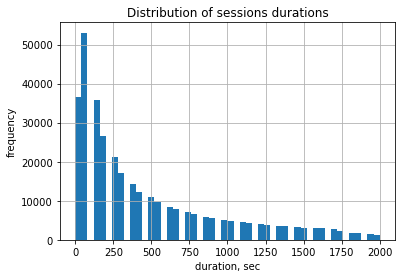

In [52]:
# let's check the distribution of sessions durations
visits['duration_sec'].hist(bins=50, range=(0, 2000)).set_title('Distribution of sessions durations')
plt.xlabel('duration, sec')
plt.ylabel('frequency')

Распределение длительности пользовательской сесии не похоже на нормальное распределение, кроме того, среднее будет сильно смещено в большую сторону. Узнаем среднюю продолжительность ASL по моде.

In [53]:
print('ASL:', int(visits['duration_sec'].mode()), 'sec')

ASL: 60 sec


In [54]:
# visits info for 2017
visits_2017 = visits.query('session_year == 2017')

In [55]:
# visits info for 2018
visits_2018 = visits.query('session_year == 2018')

In [56]:
print('ASL 2017:', int(visits_2017['duration_sec'].mode()), 'sec')

ASL 2017: 60 sec


In [57]:
print('ASL 2018:', int(visits_2018['duration_sec'].mode()), 'sec')

ASL 2018: 60 sec


# посмотрим продолжительность сесий для дат, когда сайт посетило наибольшее количество людей
2018-05-31, 2017-11-24

In [58]:
visits_24_11 = visits.query('(ssn_start >= datetime(2017, 11, 24, 0, 0)) and (ssn_start <= datetime(2017, 11, 24,23,59))')

In [59]:
visits_05_31 = visits.query('(ssn_start >= datetime(2018, 5, 31, 0, 0)) and (ssn_start <= datetime(2018, 5, 31,23,59))')

In [60]:
extra_visits = pd.concat([visits_24_11, visits_05_31], ignore_index=True)

In [61]:
extra_visits.groupby(['session_date', 'device']).agg({'duration_sec':'median'})

duration_sec
session_date device               
2017-11-24   desktop           540
             touch             360
2018-05-31   desktop           420
             touch             240

In [62]:
# let's check mode
extra_visits.groupby(['session_date', 'device']).duration_sec.apply(lambda x: x.mode())

session_date  device    
2017-11-24    desktop  0    60
              touch    0    60
2018-05-31    desktop  0    60
              touch    0    60
Name: duration_sec, dtype: int64

### Вывод:
    В среднем пользователь проводит 1 минуту, изучая сайт Яндекс.Афиша, как на компьютере, так в мобильной версии. Падения средней продолжительности сессии за год не было выявлено. По месяцам медианное значение также остается на одном уровне, увеличиваясь в дни, когда сайтом пользуется большое количество людей в связи с особыми событиями, как черная пятница, празники, каникулы. Судя по медианным значениям для компьютеров и планшетов, мобильная версия работает исправно: сессии чуть короче десктопных. 
    
<b>Вопросы:</b> Успевает ли пользователь за 1 минуту сделать заказ? Те, кто сделал заказ в среднем проводят на сайте столько же времени, что и те, кто посещает сайт в поисках интересных событий? Как отличаются конверсии в продажи у мобильной и десктопной версии?


Посмотрим как менялась средняя продолжительность 1 сессии по месяцам.

In [63]:
asl_monthly = visits.groupby(['device','session_year', 'session_month']).agg({'user_id':'nunique', 'duration_sec':'median'})
asl_monthly

user_id  duration_sec
device  session_year session_month                       
desktop 2017         6                 9761           300
                     7                10145           300
                     8                 8611           300
                     9                13509           300
                     10               21286           360
                     11               24439           360
                     12               23294           360
        2018         1                20350           360
                     2                20574           360
                     3                19574           360
                     4                14844           300
                     5                14312           300
touch   2017         6                 3655           180
                     7                 4223           180
                     8                 3132           180
                     9                 5679           180
                     10                8856           180
                     11                8913           240
                     12                8785           240
        2018         1                 8741           180
                     2                 8590           180
                     3                 8303           180
                     4                 6387           180
                     5                 6647           180

Text(0, 0.5, 'Session length, min')

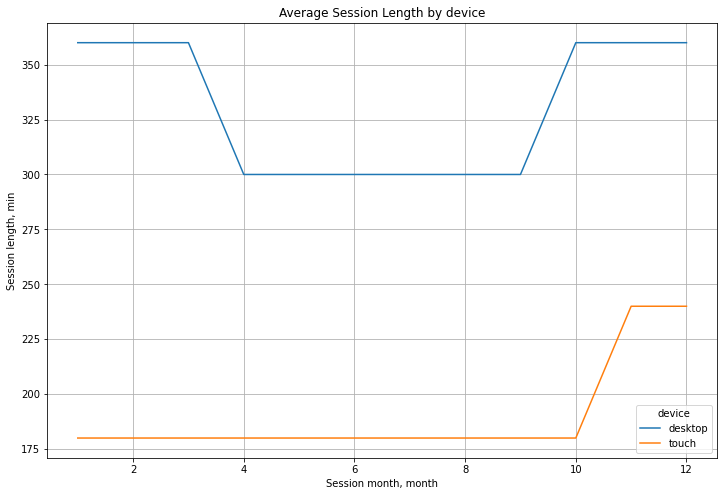

In [64]:
visits.pivot_table(index = 'session_month', columns = 'device', values = 'duration_sec', \
                   aggfunc = 'median').plot(grid = True, figsize = (12, 8))

plt.title('Average Session Length by device')
plt.xlabel('Session month, month')
plt.ylabel('Session length, min')

In [65]:
asl_device = visits.groupby(['session_year', 'device']).agg({'user_id':'nunique', 'duration_sec':'median'})
asl_device

user_id  duration_sec
session_year device                        
2017         desktop    96303           360
             touch      39118           180
2018         desktop    79623           360
             touch      35625           180

In [66]:
# visits info for desctop version
visits_dtop = visits.query('device == "desktop"')

In [67]:
print('ASL on desktop version 2018: {} sec'.format(int(visits_dtop['duration_sec'].mode())))

ASL on desktop version 2018: 60 sec


### Вывод: 
    Медианные значения средней продолжительности сессии для десктопной и мобильной версий разнятся. В то время как значение моды остается на прежнем уровне: 1 минута для среднестатистической сессии. Скорее всего те пользователи, кто хочет сделать заказ и более подробный поиск, делают его на компьютере. А быстрый поиск или ознакомление с сайтом в среднем не занимает у пользователей больше минуты как за компьютером, так и за телефоном/планшетом. Это можно проверить воронкой конверсии в продажи для 2 разных версий сайта. 

#  Sticky Factor
<a id=section3_1_3 ></a> <>

In [68]:
w_sticky_f = dau_total / wau_total*100
m_sticky_f = dau_total / mau_total*100
print('Weekly sticky factor:', int(w_sticky_f), '%', '\n', 'Monthly sticky factor:', int(m_sticky_f), '%', sep='')

Weekly sticky factor:15%
Monthly sticky factor:3%


### Вывод:
    Регулярность использования приложения не высокая. 13% пользователей еженедельно возвращаются на сайт. И только 3% пользователей возвращаются в приложение в течение месяца. Популярные игровые приложения имеют показатель в 20-25%. Да, до игровых показателей еще далеко.  

# Custоmer Retention Rate
<a id=section3_1_4 ></a> <>

Клиенты приходят и уходят, а чем дольше привлечённый пользователь пользуется продуктом, тем выше потенциальная выручка и чем дольше пользователи пользуются сервисом, тем больше аудитории увидит объявления рекламодателя. <br>
Данный показатель отражает реальную картину лояльности клиентов по отношению к бизнесу. Показатель важен, потому что многочисленные исследования уже доказали, что бизнесу дешевле удержать текущих клиентов, нежели привлекать новых.<br>

Проверим Retention rate для нашего сервиса. Интересно, какой процент пользователей, пришедших впервые до сих пор пользуются Яндекс Афишей. <br>

Коэффициент удержания вычислим сначала для всей таблицы, а потом для компьютеров, разбив на когорты по месяцам. а для моб версии по неделям. <br>

CRR =((количество покупателей на конец периода – количество новых покупателей)/количество клиентов на начало периода)*100 <br>
Коэффициент удержания = ((CEnd – CNew) / CStart)) * 100%

In [69]:
# first activity date
# creating a new df 'user_activity' the same as visits but with a column of first activity date 
# for each user we are adding his first activity date

first_activity_date = visits.groupby(['user_id'])['ssn_start'].min()
first_activity_date.name = 'first_activity_date'
user_activity = visits.join(first_activity_date,on='user_id') 

#### Так как один и тот же пользователь может найти событие, а сделать заказ на компьютере, я считаю справедливым считать RR одновременно для 2 версий сайта (моб и десктоп).            

+ Разобъем lifetime на недели.
В случае с мобильным приложением результаты этих изменений так быстро сказываются на действиях пользователей, что новые решения надо принимать быстрее. А значит, формировать когорты по данным не за месяц, а за неделю.
+ Получим день начала недели, за которую произошло событие. Он станет идентификатором недели. Параметр unit метода pd.to_timedelta задаёт единицу измерения — в нашем случае дня: unit='d'. Вычтем из даты порядковый номер дня:

In [70]:
# weeks when a user was active
user_activity['activity_week'] = pd.to_datetime(user_activity['ssn_start'], unit='d') - \
                                    pd.to_timedelta(user_activity['ssn_start'].dt.dayofweek, unit='d')

# the first activity week
user_activity['first_activity_week'] = pd.to_datetime(user_activity['first_activity_date'], unit='d') - \
                                    pd.to_timedelta(user_activity['first_activity_date'].dt.dayofweek, unit='d') 

# numbers of weeks 2nd way of extracting month number
#user_activity['n_first_activity_week'] = user_activity['first_activity_week'].dt.week
#user_activity['n_activity_week'] = user_activity['activity_week'].dt.week

In [71]:
user_activity['cohort_lifetime'] = user_activity['activity_week'] - user_activity['first_activity_week']
user_activity['cohort_lifetime'] = user_activity['cohort_lifetime'] / np.timedelta64(1,'W')
user_activity['cohort_lifetime'] = user_activity['cohort_lifetime'].astype('int') 

#2nd way od the same result
#user_activity['n_cohort_lifetime'] = user_activity['n_activity_week'] - user_activity['n_first_activity_week']

Сгруппируем данные по первому посещению(т е по когортам) и по lifetime когорт. Посчитаем для каждой когорты количество активных пользователей на определённую «неделю жизни»:

In [72]:
# adding index with ().reset_index()
cohorts = (user_activity.groupby(['first_activity_week', 'cohort_lifetime']).agg({'user_id':'nunique'})).reset_index()

Чтобы найти Retention Rate, нужно сперва получить число пользователей, изначально бывших в когорте, и на него разделить число пользователей в каждую следующую неделю.
Найдём исходное количество пользователей в когорте. Возьмём их число на нулевую неделю:

In [73]:
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_activity_week','user_id']]
initial_users_count = initial_users_count.rename(columns={'user_id':'cohort_users'}) 

In [74]:
#Объединим данные по когортам с исходным количеством пользователей в когорте:
cohorts = cohorts.merge(initial_users_count, on='first_activity_week')

# chohort_users = initial_users (CStart)
# user_id = active users of the week examined (CEnd - CNew)

In [75]:
cohorts['retention'] = cohorts['user_id']/cohorts['cohort_users']*100

Построим кривую изменения коэффициента удержания. 

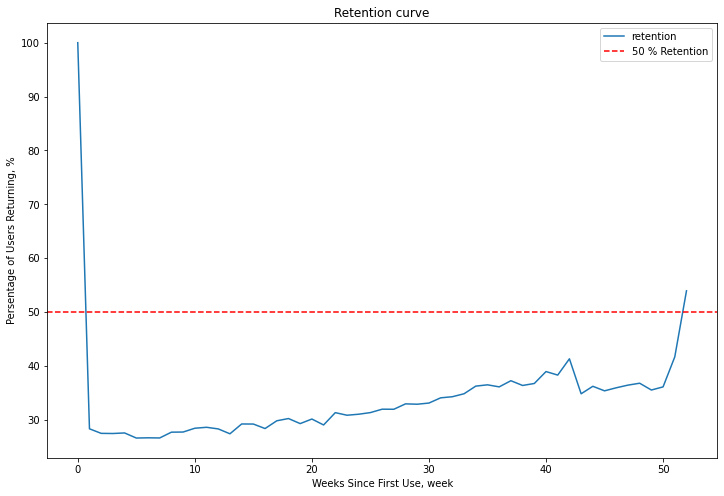

In [76]:
cohorts.groupby('cohort_lifetime')['retention'].mean().plot(figsize=(12, 8))
plt.title('Retention curve')
plt.axhline(y = 50, label = '50 % Retention', color = 'red', linestyle = '--')
plt.xlabel('Weeks Since First Use, week')
plt.ylabel('Persentage of Users Returning, %')
plt.legend()

# Вывод:
    В начале изучаемого периода в первые месяцы уходило 70% клиентов, но уже к концу изучаемого периода Retention Rate поднялся выше 50%. Это хороший показатель того, что сайт нравится пользователям и уже половинa пользователей вернулась. За этой метрикой очень важно следить, так как она чувствительна к изменениям пользовательского одобрения и хорошо показывает успешность и провал нововведений. 


Таблица user_activity уже готова для когортного анализа, осталось только вычислить lifetime в месяцах. 

In [77]:
user_activity['first_activity_month'] = user_activity['first_activity_date'].astype('datetime64[M]')
user_activity['activity_month'] = user_activity['session_date'].astype('datetime64[M]')
 
user_activity['month_lifetime'] = user_activity['activity_month'] - user_activity['first_activity_month']
user_activity['month_lifetime'] = user_activity['month_lifetime'] / np.timedelta64(1,'M')
user_activity['month_lifetime'] = user_activity['month_lifetime'].round().astype('int')

In [78]:
user_activity.head()

,device,ssn_end,source_id,ssn_start,user_id,session_year,session_month,session_week,session_date,duration_sec,first_activity_date,activity_week,first_activity_week,cohort_lifetime,first_activity_month,activity_month,month_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,1080,2017-12-20 17:20:00,2017-12-18 17:20:00,2017-12-18 17:20:00,0,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,1680,2018-02-19 16:53:00,2018-02-19 16:53:00,2018-02-19 16:53:00,0,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,0,2017-07-01 01:54:00,2017-06-26 01:54:00,2017-06-26 01:54:00,0,2017-07-01,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-05-14 10:59:00,2018-03-05 20:05:00,9,2018-03-01,2018-05-01,2
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,0,2017-12-27 14:06:00,2017-12-25 14:06:00,2017-12-25 14:06:00,0,2017-12-01,2017-12-01,0


Сгруппируем данные по первому посещению(т е по когортам) и по lifetime когорт. Посчитаем для каждой когорты количество активных пользователей на определённый «месяц жизни»:


In [79]:
month_cohorts = user_activity.groupby(['first_activity_month', 'month_lifetime']).agg({'user_id':'nunique'}).reset_index()
month_cohorts = month_cohorts.rename(columns={'user_id':'monthly_users'})

Чтобы найти Retention Rate, нужно сперва получить число пользователей, изначально бывших в когорте, и на него разделить число пользователей в каждую следующую неделю.
Найдём исходное количество пользователей в когорте. Возьмём их число на нулевой месяц:
 

In [80]:
# number of people from 1st month of existence for each date

initial_users_month = month_cohorts[month_cohorts['month_lifetime'] == 0][['first_activity_month',\
                                                                           'monthly_users']].reset_index()

initial_users_month = initial_users_month.rename(columns={'monthly_users':'cohort_users'})
initial_users_month

,index,first_activity_month,cohort_users
0,0,2017-06-01,13259
1,12,2017-07-01,13140
2,23,2017-08-01,10181
3,33,2017-09-01,16704
4,42,2017-10-01,25977
5,50,2017-11-01,27248
6,57,2017-12-01,25268
7,63,2018-01-01,22624
8,68,2018-02-01,22197
9,72,2018-03-01,20589


In [81]:
#Объединим данные по когортам с исходным количеством пользователей в когорте:
month_cohorts = month_cohorts.merge(initial_users_month, on='first_activity_month')
month_cohorts

,first_activity_month,month_lifetime,monthly_users,index,cohort_users
0,2017-06-01,0,13259,0,13259
1,2017-06-01,1,1043,0,13259
2,2017-06-01,2,713,0,13259
3,2017-06-01,3,814,0,13259
4,2017-06-01,4,909,0,13259
...,...,...,...,...,...
73,2018-03-01,1,861,72,20589
74,2018-03-01,2,557,72,20589
75,2018-04-01,0,15709,75,15709
76,2018-04-01,1,760,75,15709


In [82]:
month_cohorts['retention'] = month_cohorts['monthly_users']/month_cohorts['cohort_users']*100

In [83]:
month_cohorts.head()

,first_activity_month,month_lifetime,monthly_users,index,cohort_users,retention
0,2017-06-01,0,13259,0,13259,100.000000
1,2017-06-01,1,1043,0,13259,7.866355
2,2017-06-01,2,713,0,13259,5.377479
3,2017-06-01,3,814,0,13259,6.139226
4,2017-06-01,4,909,0,13259,6.855721


In [84]:
month_retention_pivot = month_cohorts.pivot_table(index='first_activity_month',\
                            columns='month_lifetime',values='retention',aggfunc='sum').drop([0], axis=1)
# drop for deleting the column of 100 %

display(month_retention_pivot.fillna(''))

month_lifetime,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,
2017-06-01,7.86635,5.37748,6.13923,6.85572,7.14232,6.10152,5.77721,5.23418,5.08334,4.06516,4.49506
2017-07-01,5.60883,5.12938,5.61644,5.82192,4.81735,4.53577,4.57382,3.88128,2.86149,2.74734,
2017-08-01,7.6908,6.28622,6.2764,5.00933,4.40035,3.63422,3.94853,2.78951,2.60289,,
2017-09-01,8.54885,6.9205,5.07064,3.93918,3.78352,3.58597,2.41858,2.28089,,,
2017-10-01,7.8608,5.22385,3.89575,3.42611,3.22208,2.13651,2.03642,,,,
2017-11-01,7.8281,4.41133,3.86817,3.37272,2.34146,2.17998,,,,,
2017-12-01,5.58018,3.79927,3.11065,2.02628,1.90359,,,,,,
2018-01-01,5.97153,3.93388,2.49735,2.0244,,,,,,,
2018-02-01,5.70798,2.54539,2.00928,,,,,,,,


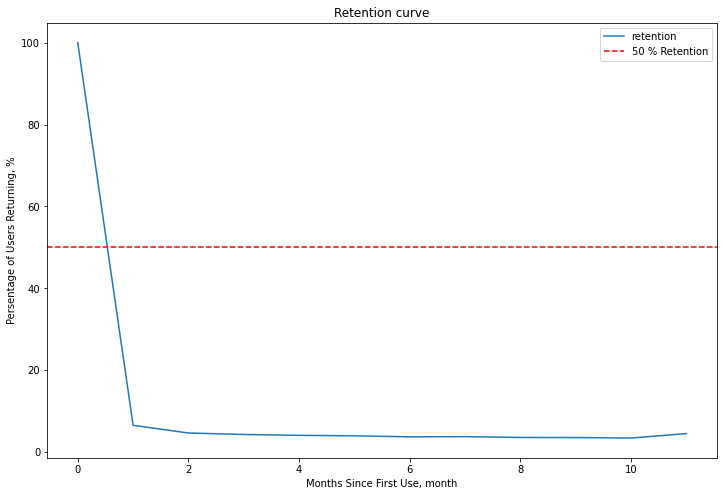

In [85]:
month_cohorts.groupby('month_lifetime')['retention'].mean().plot(figsize=(12, 8))
plt.title('Retention curve')
plt.axhline(y = 50, label = '50 % Retention', color = 'red', linestyle = '--')
plt.xlabel('Months Since First Use, month')
plt.ylabel('Persentage of Users Returning, %')
plt.legend()

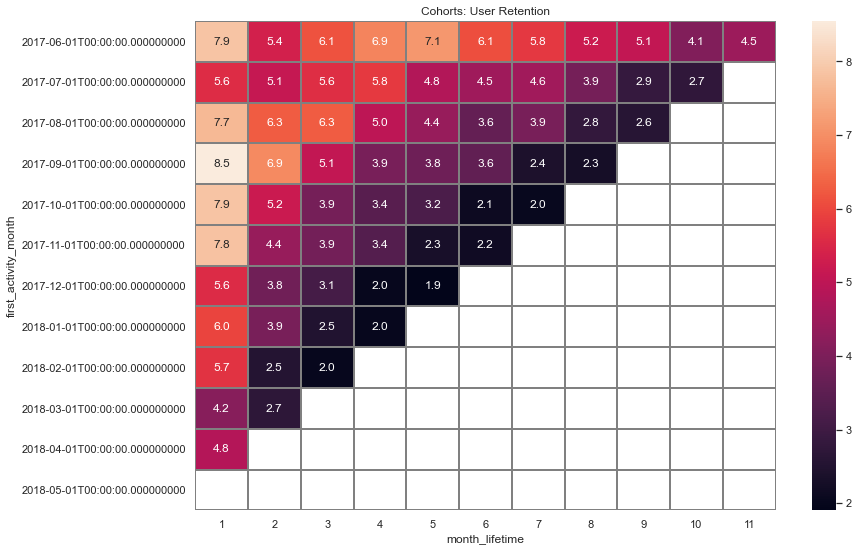

In [86]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
sns.heatmap(month_retention_pivot, annot=True, fmt='.1f', linewidths=1, linecolor='gray'); 

# 3.2 Продажи 
<a id='section3_2'></a> <>
[Table of content](#table_of_content)

Когда люди начинают покупать?
Сколько раз покупают за период?
Какой средний чек?
Сколько денег приносят? (LTV)

Чтобы ответить на эти вопросы приступим к когортному анализу. Разделим пользователей по дате первого обращения на сайт. 

Таблица visits (лог сервера с информацией о посещениях сайта):
user_id — уникальный идентификатор пользователя
device — категория устройства пользователя
ssn_start — дата и время начала сессии
ssn_end — дата и время окончания сессии
source_id — идентификатор рекламного источника, из которого пришел пользователь

Таблица orders (информация о заказах):
user_id — уникальный id пользователя, который сделал заказ
order_date — дата и время заказа
revenue — выручка Яндекс.Афиши с этого заказа




Есть данные о каждом покупателе интернет-магазина: дата и стоимость его заказа. Задача: понять, как по месяцам изменяется количество пользователей, совершивших покупку впервые. Когда выяснится, растёт число «новичков» или падает, можно будет понять, кто прибыльнее — старые покупатели или новые.

<b> Июньский период не был изучен целиком, поэтому удалим его. </b>

In [87]:
# deleting june period as not studied
orders = orders.query('order_date < datetime(2018,6,1)')

# Когда люди начинают покупать? 
<a id=section3_2_1 ></a> <>
Исследуем сколько времени проходит между первым посещением и первой покупкой. Построим гистограмму, найдем среднее и медиану.

In [89]:
# creating a column with first activity date

first_activity_date_id = visits.groupby('user_id')['ssn_start'].min()
first_activity_date_id.name = 'first_ssn_date'

In [90]:
first_order_date_id = orders.groupby('user_id')['order_date'].min()


In [91]:
# let's rename our series object so in the futere it's ready to be added to the main df

first_order_date_id.name = 'first_order_date'

In [92]:
# df with first session and first order

history = pd.concat([first_activity_date_id, first_order_date_id], axis=1).dropna(axis=0)

display(history.head())

,first_ssn_date,first_order_date
user_id,,
313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00
1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2429014661409475,2017-10-11 17:14:00,2017-10-11 18:33:00
2464366381792757,2018-01-27 20:10:00,2018-01-28 15:54:00
2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00


In [93]:
history['wait_time'] = history['first_order_date'] - history['first_ssn_date']

In [94]:
history['wait_time'].describe()

count                      36522
mean     16 days 21:40:50.532281
std      47 days 01:45:34.984683
min              0 days 00:00:00
25%              0 days 00:04:00
50%              0 days 00:16:00
75%              2 days 00:17:30
max            363 days 07:04:00
Name: wait_time, dtype: object

In [95]:
fig = px.histogram(history, x="wait_time", marginal="box", title = 'Распределение временного периода от первого посещения до покупки',\
                   labels={
                     "count": "Количество",
                     "wait_time": "Сколько дней проходит до первой покупки"                     
                 })
fig.show()

# Вывод: 
    + Из 228169 посещений было сделано 36522 покупки. 
    + То есть чаще всего покупка не совершается, либо совершается в тот же день (в 50% случаев) или в 25% случаях проходит 2 дня. Совсем редко пользователь не совершает первую покупку до года.
    + Среднее значение составляет 16 дней, но нужно понимать, что оно сильно смещено вправо (завышено) из-за длинного хвоста нетипичных значений

In [96]:
# let's merge the new column and the main df

orders = orders.join(first_order_date_id, on='user_id')
display(orders.head())

,order_date,revenue,user_id,first_order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00


In [97]:
orders['first_order_month'] = orders['first_order_date'].astype('datetime64[M]')
orders['order_month'] = orders['order_date'].astype('datetime64[M]')

# Когортный анализ
<a id=section3_2_2 ></a> <>

Когортой сделаем столбец first_order_month — месяц, в котором был сделан первый заказ. Сгруппируем данные по этому столбцу и оценим показатели каждой когорты.

In [98]:
cohort_grouped = orders.groupby('first_order_month')\
    .agg({'user_id':'nunique','revenue':'sum'})

In [99]:
cohort_grouped

,user_id,revenue
first_order_month,,
2017-06-01,2023,24031.69
2017-07-01,1923,16127.92
2017-08-01,1370,11606.26
2017-09-01,2581,34676.32
2017-10-01,4340,27603.45
2017-11-01,4081,26098.99
2017-12-01,4383,33485.74
2018-01-01,3373,16663.13
2018-02-01,3651,16750.50


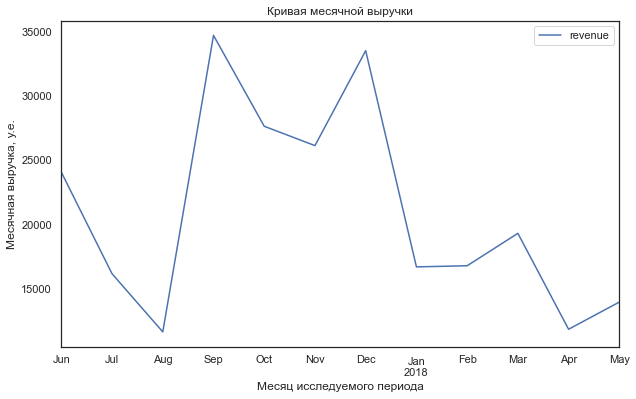

In [100]:
cohort_grouped['revenue'].plot(figsize=(10, 6))
plt.title('Кривая месячной выручки')
plt.xlabel('Месяц исследуемого периода')
plt.ylabel('Месячная выручка, у.е.')
plt.legend()

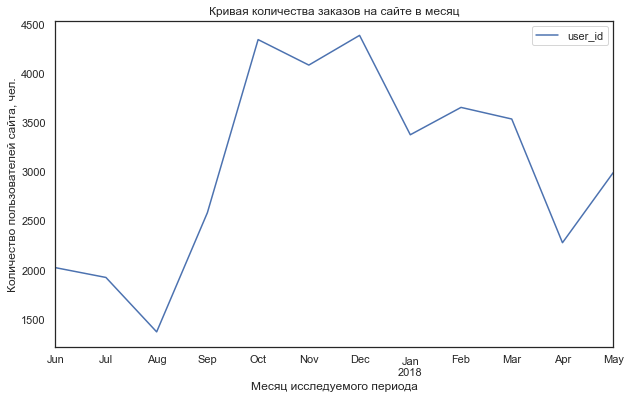

In [101]:
cohort_grouped['user_id'].plot(figsize=(10, 6))
plt.title('Кривая количества заказов на сайте в месяц')
plt.xlabel('Месяц исследуемого периода')
plt.ylabel('Количество пользователей сайта, чел.')
plt.legend()

### Вывод:
    После декабря выручка по каждой следующей когорте меньше предыдущей. Это логично, ведь более старые когорты существуют дольше, и пользователи из них совершали заказы в течение бóльшего времени.
А ещё: количество пользователей, составляющих каждую когорту, возрасло с момента выгрузки данных: за зиму появилось много новых пользователей. Наблюдаем положительную тенденцию роста аудитории сайта. Июнь еще не был изучен. 

#### Узнаем, как изменяется поведение каждой когорты на протяжении времени. Например, определим, снижается ли средний чек клиентов и одинаковый ли доход получает компания от клиентов, привлечённых в разные периоды.

# Оценка изменений абсолютных показателей по месяцам
<a id=section3_2_3 ></a> <>

Отследим, как изменяется количество покупающих пользователей и выручка внутри одной когорты. Это позволит понять, сколько людей продолжают покупать в следующих месяцах после совершения первой покупки. <br>
 Сколько раз покупают за период?

In [102]:
# quantity of orders per month
orders.pivot_table(index='first_order_month',
    columns='order_month',
    values='user_id',
    aggfunc='count').fillna('')

order_month,2017-06-01,2017-07-01,2017-08-01,2017-09-01,2017-10-01,2017-11-01,2017-12-01,2018-01-01,2018-02-01,2018-03-01,2018-04-01,2018-05-01
first_order_month,,,,,,,,,,,,
2017-06-01,2354,177,174,226,292,218,276,174,212,153,96,86.0
2017-07-01,,2186,100,120,104,72,82,61,50,58,24,53.0
2017-08-01,,,1533,108,100,81,85,62,49,78,46,46.0
2017-09-01,,,,2933,219,161,164,67,109,108,56,61.0
2017-10-01,,,,,4964,314,162,122,129,103,86,125.0
2017-11-01,,,,,,4813,397,182,211,136,59,102.0
2017-12-01,,,,,,,5052,270,202,179,86,105.0
2018-01-01,,,,,,,,3783,224,159,64,78.0
2018-02-01,,,,,,,,,4095,222,83,70.0


In [103]:
# quantity of unique users who still order from time to time within each chohort

orders.pivot_table(index='first_order_month',
    columns='order_month',
    values='user_id',
    aggfunc='nunique').fillna('')

order_month,2017-06-01,2017-07-01,2017-08-01,2017-09-01,2017-10-01,2017-11-01,2017-12-01,2018-01-01,2018-02-01,2018-03-01,2018-04-01,2018-05-01
first_order_month,,,,,,,,,,,,
2017-06-01,2023,61,50,54,88,67,62,47,58,45,45,53.0
2017-07-01,,1923,52,57,64,49,38,36,39,42,22,26.0
2017-08-01,,,1370,58,53,44,40,32,30,44,19,31.0
2017-09-01,,,,2581,130,100,74,52,64,66,37,43.0
2017-10-01,,,,,4340,206,123,92,93,72,56,67.0
2017-11-01,,,,,,4081,222,120,106,81,48,62.0
2017-12-01,,,,,,,4383,146,103,97,50,63.0
2018-01-01,,,,,,,,3373,114,83,43,45.0
2018-02-01,,,,,,,,,3651,118,58,39.0


### Вывод по этой таблице:
* После первого месяца количество покупателей в когорте снижается.
* В некоторых когортах число покупателей периодически начинает расти. Например, в когорте 2017-09-01.
* Количество покупателей уменьшается во всех когортах в декабре 2011. Возможно, это связано с сезонностью.
* Пользовательская когорта июня 2017 года и октября 2017 продолжают составлять сравнительно большую долю покупателей даже спустя год. В мае 2018 года их 53 человека, по сравнению с более "молодыми" когортами это хороший показатель.
* Если говорить о сезонности, то в октябре, ноябре и декабре произошло заметное увеличение новых пользователей, возрос интерес к ресурсу. 
* Пользователи июньской когорты через год сохраняют хороший уровень заказов относительно других когорт, количество заказов которых падает быстрее. 

# Оценка изменений относительных показателей по времени жизни
<a id=section3_2_4 ></a> <>

Какой средний чек? <br>
Ещё одна задача когортного анализа: понять, как с течением времени изменяется средний чек — сумма покупок, делённая на число покупателей. Так узнаем, увеличивается или уменьшается средний чек покупателей, которые продолжают делать заказы в интернет-магазине.

In [104]:
# total revenue and number of members for each cohort
orders_grouped_by_cohorts = orders.groupby(['first_order_month','order_month']).agg({'revenue':'sum','user_id':'nunique'})
# orders_grouped_by_cohorts

Найдём средний чек покупателя revenue_per_user. <br>
Средний чек - это средняя выручка в месяц на покупателя, а не на отдельную транзакцию.


In [105]:
# revenue_per_user

orders_grouped_by_cohorts['revenue_per_user'] = orders_grouped_by_cohorts['revenue'] / \
                                                orders_grouped_by_cohorts['user_id'] 

In [106]:
# pivot table with average bill per user

orders_grouped_by_cohorts.pivot_table(index='first_order_month',columns='order_month',\
                                      values='revenue_per_user',aggfunc='mean').fillna('')

order_month,2017-06-01,2017-07-01,2017-08-01,2017-09-01,2017-10-01,2017-11-01,2017-12-01,2018-01-01,2018-02-01,2018-03-01,2018-04-01,2018-05-01
first_order_month,,,,,,,,,,,,
2017-06-01,4.72441,16.0954,17.7068,35.7648,23.5066,22.2078,31.0119,25.0332,19.2957,27.2336,25.6813,9.804151
2017-07-01,,6.01022,12.3963,21.036,10.7861,6.93816,7.89684,6.42111,6.99282,7.38214,12.8618,11.513846
2017-08-01,,,5.27652,11.1488,11.8513,12.183,16.9212,12.1391,9.62033,12.6105,21.07,8.307419
2017-09-01,,,,5.64453,22.1884,13.4452,138.669,19.8815,26.095,27.4371,16.9614,11.044651
2017-10-01,,,,,5.00373,11.2874,6.75325,7.41315,7.0728,7.25514,6.57321,7.479701
2017-11-01,,,,,,5.15468,7.33905,6.78658,12.5107,7.45728,4.58083,7.564839
2017-12-01,,,,,,,4.73819,7.81658,39.366,48.1351,27.4314,23.518413
2018-01-01,,,,,,,,4.13564,8.72123,12.3655,11.1998,4.699556
2018-02-01,,,,,,,,,4.15699,8.61,4.94241,6.941026


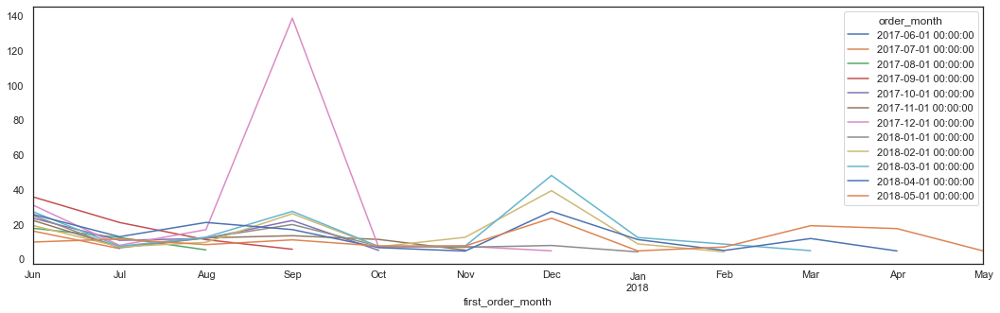

In [107]:
orders_grouped_by_cohorts.pivot_table(index='first_order_month',columns='order_month',\
                                      values='revenue_per_user',aggfunc='mean').plot(figsize=(18, 5))

In [108]:
orders_grouped_by_cohorts['revenue_per_user'].describe()

count     78.000000
mean      14.878613
std       16.823331
min        4.135636
25%        6.938879
50%       11.096722
75%       18.843122
max      138.669189
Name: revenue_per_user, dtype: float64

In [109]:
print(('Средний чек покупателя составляет {:.2f} y.e.'\
      .format(orders_grouped_by_cohorts['revenue_per_user'].median())))


Средний чек покупателя составляет 11.10 y.e.


Как изменяется средний чек от месяца к месяцу? В каком месяце самый высокий средний чек?

### Вывод:
    Средний чек не превышает 20 у.е и составляет 11 у.е. Обычно его значения колеблятся от 4 до 18 у.е. Самый высокий средний чек зафиксирован в сентябре у июньской когорты, тогда он составил 19у.е. 

#### Возможно, молодые когорты занижают нам показатели. Урежем изучаемый период до полугода: с 2017-11-01 для когорт с июня по декабрь

In [110]:
half_orders = orders.query('order_month >= datetime(2017,12,1) and first_order_date < datetime(2018,1,1)')


In [111]:
half_orders_grouped_by_cohorts = (half_orders.groupby(['first_order_month','order_month'])
                                  .agg({'revenue':'sum','user_id':'nunique'}))

In [112]:
half_orders_grouped_by_cohorts['revenue_per_user'] = half_orders_grouped_by_cohorts['revenue'] / \
                                                half_orders_grouped_by_cohorts['user_id']

In [113]:
half_orders_grouped_by_cohorts.pivot_table(index='first_order_month',columns='order_month',\
                                      values='revenue_per_user', aggfunc='mean').fillna('')

order_month,2017-12-01,2018-01-01,2018-02-01,2018-03-01,2018-04-01,2018-05-01
first_order_month,,,,,,
2017-06-01,31.011935,25.033191,19.295690,27.233556,25.681333,9.804151
2017-07-01,7.896842,6.421111,6.992821,7.382143,12.861818,11.513846
2017-08-01,16.921250,12.139063,9.620333,12.610455,21.070000,8.307419
2017-09-01,138.669189,19.881538,26.095000,27.437121,16.961351,11.044651
2017-10-01,6.753252,7.413152,7.072796,7.255139,6.573214,7.479701
2017-11-01,7.339054,6.786583,12.510660,7.457284,4.580833,7.564839
2017-12-01,4.738191,7.816575,39.366019,48.135052,27.431400,23.518413


# Вывод: 
    Средний чек не был занижен более новыми когортами. 

# Изменение среднего чека со времени первой покупки для когорт
<a id=section3_2_5 ></a> <>

In [114]:
# adding a columnn of life time for cohorts

orders_grouped_by_cohorts = orders_grouped_by_cohorts.reset_index()
orders_grouped_by_cohorts['cohort_lifetime'] = orders_grouped_by_cohorts['order_month'] - \
                                            orders_grouped_by_cohorts['first_order_month']

orders_grouped_by_cohorts['cohort_lifetime'].head() 

0     0 days
1    30 days
2    61 days
3    92 days
4   122 days
Name: cohort_lifetime, dtype: timedelta64[ns]

In [115]:
# let's change day's amount on month's amount
orders_grouped_by_cohorts['cohort_lifetime'] = orders_grouped_by_cohorts['cohort_lifetime'] / np.timedelta64(1,'M')

In [116]:
# amount value must be integer 
orders_grouped_by_cohorts['cohort_lifetime'] = orders_grouped_by_cohorts['cohort_lifetime'].round().astype('int')

# leaving only year and month
orders_grouped_by_cohorts['first_order_month'] = orders_grouped_by_cohorts['first_order_month'].dt.strftime('%Y-%m') 

In [117]:
revenue_per_user_pivot = (orders_grouped_by_cohorts.pivot_table(index='first_order_month',
                                    columns='cohort_lifetime',values='revenue_per_user',aggfunc='mean')
)

revenue_per_user_pivot.fillna('')

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06,4.724414,16.0954,17.7068,35.7648,23.5066,22.2078,31.0119,25.0332,19.2957,27.2336,25.6813,9.80415
2017-07,6.010218,12.3963,21.036,10.7861,6.93816,7.89684,6.42111,6.99282,7.38214,12.8618,11.5138,
2017-08,5.276518,11.1488,11.8513,12.183,16.9212,12.1391,9.62033,12.6105,21.07,8.30742,,
2017-09,5.644529,22.1884,13.4452,138.669,19.8815,26.095,27.4371,16.9614,11.0447,,,
2017-10,5.003733,11.2874,6.75325,7.41315,7.0728,7.25514,6.57321,7.4797,,,,
2017-11,5.154683,7.33905,6.78658,12.5107,7.45728,4.58083,7.56484,,,,,
2017-12,4.738191,7.81658,39.366,48.1351,27.4314,23.5184,,,,,,
2018-01,4.135636,8.72123,12.3655,11.1998,4.69956,,,,,,,
2018-02,4.156987,8.61,4.94241,6.94103,,,,,,,,


Тепловая карта изменения среднего чека покупателей
<a id=heatmap3_2_5></a> <>
[Back to Summary](#section4)

Text(93.5, 0.5, 'Жизненный период когорты')

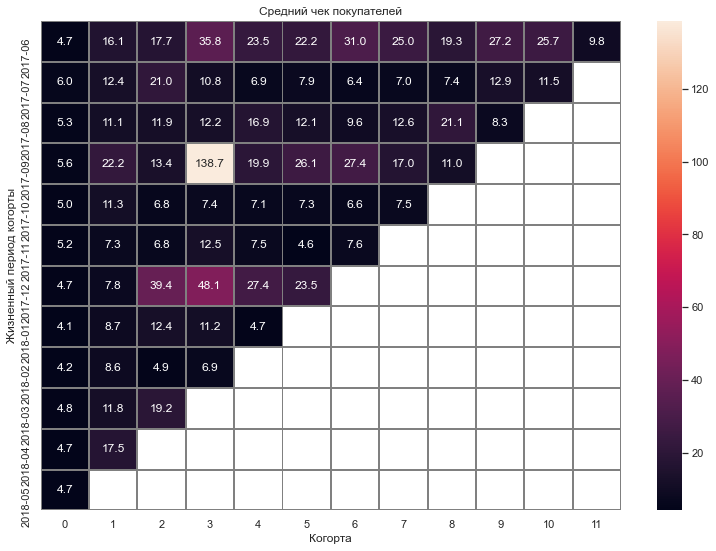

In [118]:
plt.figure(figsize=(13, 9))
plt.title('Средний чек покупателей')
sns.heatmap(revenue_per_user_pivot, annot=True, fmt='.1f', linewidths=1, linecolor='gray') 

plt.xlabel('Когорта')
plt.ylabel('Жизненный период когорты')

### Вывод:
    Во всех когортах средний чек пользователей возрастает на следующий месяц после месяца первой покупки. Средний чек повсеместно растёт с течением времени. С начала периода средний чек вырос с 4 у.е до 7,5. За редким исключением встречаются чеки до 20 у.е. на покупателя. 

# LTV
<a id=section3_2_6 ></a> <>
Сколько денег приносят пользователи?

[to Summary](#section4)

In [119]:
# определяем источник пользователя
sources = visits.sort_values(by = ['user_id', 'ssn_start']).groupby('user_id').agg({'source_id': 'first'})

# соединяем первые покупки и источники 
payers = orders.groupby('user_id').agg({'order_date': 'min'}).merge(sources, on = 'user_id').reset_index()
payers = payers.rename(columns = {'order_date': 'first_buy'})

# считаем ltv
ltv = payers.merge(orders, on = 'user_id')
ltv['lifetime'] = ((ltv['order_date'] - ltv['first_buy']) / np.timedelta64(1,'M')).round().astype(int)
orders_lifetime = ltv.pivot_table(index = 'source_id', columns = 'lifetime', values = 'revenue', aggfunc = 'count').fillna(0)
buyers_lifetime = ltv.pivot_table(index = 'source_id', columns = 'lifetime', values = 'user_id', aggfunc = 'nunique').fillna(0)
ltv = ltv.pivot_table(index = 'source_id', columns = 'lifetime', values = 'revenue', aggfunc = 'sum').fillna(0)
ltv = ltv.cumsum(axis = 1)

# добавляем размеры когорт и делим на них
# div(ltv['cohort_size'], axis = 0) берет столбец cohort_size и делит на него каждый столбец фрейма
cohort_sizes = payers.groupby('source_id').agg({'user_id': 'nunique'}).rename(columns = {'user_id': 'cohort_size'})
ltv = ltv.merge(cohort_sizes, on = 'source_id')
ltv = ltv.div(ltv['cohort_size'], axis = 0).drop(columns = 'cohort_size')
display(ltv)

,0,1,2,3,4,5,6,7,8,9,10,11,12
source_id,,,,,,,,,,,,,
1,6.156185,7.150835,7.891156,8.537754,9.029303,9.251083,9.525826,9.866858,10.191256,10.450862,10.557561,10.673508,10.724577
2,6.770593,8.054740,9.717921,11.253637,11.900125,12.484390,12.721418,12.948380,13.171358,13.233560,13.346994,13.380422,13.383802
3,4.477694,4.729283,4.865748,5.008149,5.083093,5.122590,5.147003,5.173669,5.192354,5.197477,5.202699,5.203834,5.204931
4,4.584875,4.738256,4.852417,4.948765,5.068523,5.226738,5.342550,5.391216,5.410533,5.448441,5.502830,5.505582,5.506888
5,4.909883,5.114191,5.469974,6.836748,7.072747,7.246335,7.365203,7.454998,7.515129,7.576270,7.582746,7.592303,7.592558
7,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000,1.220000
9,3.880901,4.167390,4.408024,4.678888,4.788189,4.935588,5.059127,5.126608,5.244430,5.284972,5.293566,5.293566,5.293566
10,3.164131,3.227434,3.254695,3.302558,3.316576,3.319217,3.332724,3.343348,3.346102,3.348631,3.348631,3.348631,3.348631


In [120]:
visits.groupby('source_id')['user_id'].nunique()

source_id
1     18999
2     26245
3     74756
4     83525
5     56974
6         6
7        34
9      9264
10     8067
Name: user_id, dtype: int64

In [121]:
costs.groupby('source_id')['costs'].sum()

source_id
1      20833.27
2      42806.04
3     138472.17
4      61073.60
5      51757.10
9       5517.49
10      5822.49
Name: costs, dtype: float64

1, 2, 5  и 9 источники привлекают наиболее платежеспособных клиентов. От источников 6 и 7 пришло меньше 50 человек, но это были бесплатные источники трафика, как браузеры, например или рекомендации друзей. 

# LTV по первому месяцу покупки и дальнейшему сроку жизни пользователя

In [122]:
# Посчитаем количество новых покупателей (n_buyers) за каждый месяц:

cohort_quantity = orders.groupby('first_order_month').agg({'user_id': 'nunique'}).reset_index()
cohort_quantity.columns = ['first_order_month', 'n_buyers']
print(cohort_sizes.head()) 

           cohort_size
source_id             
1                 2899
2                 3506
3                10473
4                10295
5                 6931


In [123]:
# Сгруппируем таблицу заказов по месяцу первой покупки и месяцу каждого заказа и сложим выручку.
# Сбросим индекс методом reset_index():

cohort_revenue = orders.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()
cohort_revenue.head()

,first_order_month,order_month,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58


Из таблицы cohort_revenue видно какую выручку принесла каждая когорта за обределенный месяц.
Добавим в эту таблицу данные о том, сколько людей первый раз совершили покупку в каждый месяц:

In [124]:
report = pd.merge(cohort_quantity, cohort_revenue, on='first_order_month')
report.head()

,first_order_month,n_buyers,order_month,revenue
0,2017-06-01,2023,2017-06-01,9557.49
1,2017-06-01,2023,2017-07-01,981.82
2,2017-06-01,2023,2017-08-01,885.34
3,2017-06-01,2023,2017-09-01,1931.30
4,2017-06-01,2023,2017-10-01,2068.58


LTV считают не из выручки, а из валовой прибыли. Значит, нужно найти валовую прибыль, умножив выручку на маржинальность. Будейм считать, что у нас маржинальность равна 100%, так как в начальных условиях она не была дана. Так как LTV — относительный показатель, то его удобнее смотреть по «возрастным» когортам, где в столбцах — не месяц заказа, а возраст (age) когорты.

In [125]:
report['age'] = (report['order_month'] - report['first_order_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')

In [126]:
# margin_rate = 1 so gross = revenue

report['ltv'] = report['revenue'] / report['n_buyers']

In [127]:
output = report.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean')

output = output.cumsum(axis = 1)
output.fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,4.724414,5.20974,5.64738,6.60205,7.62458,8.36008,9.31052,9.89212,10.4453,11.0511,11.6224,11.8792
2017-07-01,6.010218,6.34543,6.96896,7.32794,7.50473,7.66077,7.78098,7.9228,8.08404,8.23118,8.38685,
2017-08-01,5.276518,5.74851,6.20699,6.59827,7.09232,7.37586,7.58653,7.99153,8.28374,8.47172,,
2017-09-01,5.644529,6.76212,7.28305,11.2588,11.6594,12.3065,13.0081,13.2512,13.4352,,,
2017-10-01,5.003733,5.5395,5.73089,5.88803,6.03959,6.15996,6.24477,6.36024,,,,
2017-11-01,5.154683,5.55392,5.75347,6.07842,6.22644,6.28032,6.39524,,,,,
2017-12-01,4.738191,4.99856,5.92366,6.98894,7.30187,7.63991,,,,,,
2018-01-01,4.135636,4.43039,4.73468,4.87745,4.94015,,,,,,,
2018-02-01,4.156987,4.43526,4.51378,4.58792,,,,,,,,


Text(93.49999999999999, 0.5, 'Когорта')

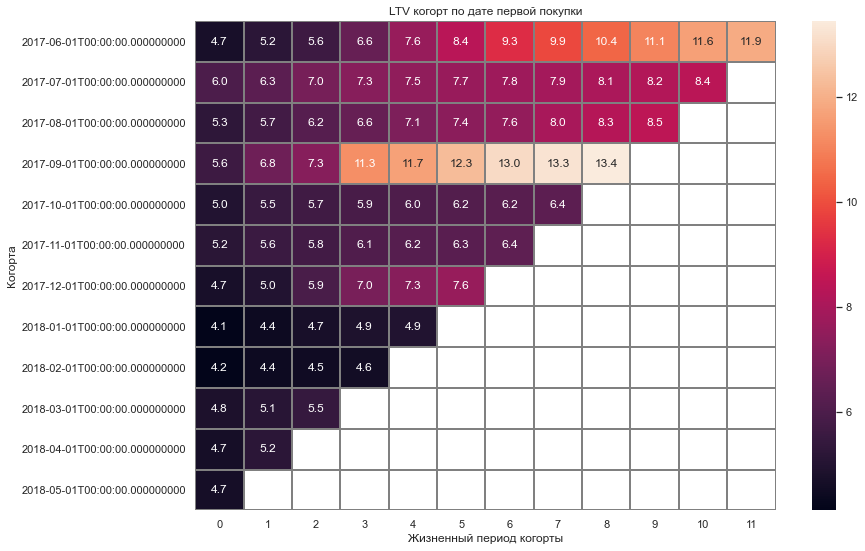

In [128]:
plt.figure(figsize=(13, 9))
sns.heatmap(output, annot=True, fmt='.1f', linewidths=1, linecolor='gray') 

plt.title('LTV когорт по дате первой покупки')
plt.xlabel('Жизненный период когорты')
plt.ylabel('Когорта')

In [129]:
# Посчитаем итоговый LTV первой когорты. Сложим их LTV по месяцам:

ltv_201706 = output.loc['2017-06-01', 11]
print('Итоговый LTV первой когорты:', ltv_201706)

Итоговый LTV первой когорты: 11.879233811171522


In [130]:
ltv_6th_cohort = output[5].mean()
print('Итоговый LTV 6ой когорты:', ltv_6th_cohort)

Итоговый LTV 6ой когорты: 7.969052630207335


# Вывод:
    LTV первой когорты составил 11.87 у.е.

In [131]:
halff_orders = orders.query('order_date < datetime(2017,12,1)') # df of only 6 months

In [132]:
# выручка за первые 6 месяцев
half_revenue = halff_orders['revenue'].sum()

In [133]:
# unique users of the first 6 months
half_users_unique = halff_orders['user_id'].nunique()

In [134]:
half_year_ltv = half_revenue / half_users_unique
half_year_ltv
print('Прмерный LTV за первые 6 месяцев {:.2f} у.е.'.format(half_year_ltv))

Прмерный LTV за первые 6 месяцев 6.39 у.е.


# 3.3 Маркетинг
<a id=section3_3 ></a> <>
[Table of content](#table_of_content)


Сколько денег потратили на каждый источник по месяцам и всего?

In [135]:
# let's add a column only with a month and a year

costs['month'] = costs['date'].dt.strftime('%Y-%m') 

In [136]:
detailed_costs = costs.pivot_table(index='source_id', columns='month', values='costs', aggfunc='sum', margins=True)
detailed_costs

month,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,2018-05,All
source_id,,,,,,,,,,,,,
1,1125.61,1072.88,951.81,1502.01,2315.75,2445.16,2341.20,2186.18,2204.48,1893.09,1327.49,1467.61,20833.27
2,2427.38,2333.11,1811.05,2985.66,4845.00,5247.68,4897.80,4157.74,4474.34,3943.14,2993.70,2689.44,42806.04
3,7731.65,7674.37,6143.54,9963.55,15737.24,15237.06,15158.34,14808.78,14228.56,13080.85,9296.81,9411.42,138472.17
4,3514.80,3529.73,3217.36,5192.26,6420.84,5388.82,7680.47,5832.79,5711.96,5961.87,4408.49,4214.21,61073.60
5,2616.12,2998.14,2185.28,3849.14,5767.40,6325.34,5872.52,5371.52,5071.31,4529.62,3501.15,3669.56,51757.10
9,285.22,302.54,248.93,415.62,609.41,683.18,657.98,547.16,551.50,480.29,373.49,362.17,5517.49
10,314.22,329.82,232.57,460.67,627.24,792.36,645.86,614.35,480.88,526.41,388.25,409.86,5822.49
All,18015.00,18240.59,14790.54,24368.91,36322.88,36119.60,37254.17,33518.52,32723.03,30415.27,22289.38,22224.27,326282.16


Text(93.5, 0.5, 'Идентификатор источника')

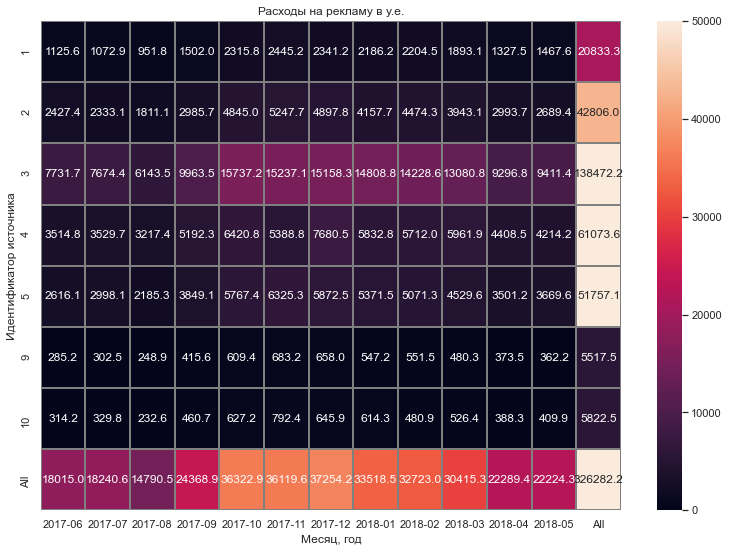

In [137]:
plt.figure(figsize=(13, 9))
plt.title('Расходы на рекламу в у.е.')
sns.heatmap(detailed_costs, annot=True, fmt='.1f', linewidths=1, linecolor='gray', \
                    vmin=0, vmax=50000) 
plt.xlabel('Месяц, год')
plt.ylabel('Идентификатор источника')

### Вывод:       
    Большинство затрат на маркетинг приходится на источник с идентификатором 3, дальше идут по убыванию 4, 5, 2 и 1. На 9 и 10 источники в год тратится суммарно 4% всего бюджета, т.е. намного меньше, чем на остальные. 

# Расчет CAC
<a id=section3_3_1 ></a> <>
Сколько стоило привлечение одного покупателя из каждого источника?

In [138]:
# считаем САС
cac = costs.pivot_table(index='source_id', values = 'costs', \
                            aggfunc='sum').merge(cohort_sizes, on = 'source_id')
cac['cac'] = cac['costs'] / cac['cohort_size']
display(cac)

,costs,cohort_size,cac
source_id,,,
1,20833.27,2899,7.186364
2,42806.04,3506,12.209367
3,138472.17,10473,13.221825
4,61073.60,10295,5.932356
5,51757.10,6931,7.467479
9,5517.49,1088,5.071222
10,5822.49,1329,4.381106


Поделим все расходы на маркетинг за полгода с июня 2017 по ноябрь 2017 включительно на всех пользователей привлеченных за этот период. 

In [139]:
half_costs = costs.query('date < datetime(2017,12,1)') # df of only 6 months

In [140]:
total_costs_6months = half_costs['costs'].sum()
print('На маркетинг было потрачено', total_costs_6months, 'y.e.')

На маркетинг было потрачено 147857.52000000002 y.e.


In [141]:
total_users_aqiuered = halff_orders['user_id'].nunique()
print('Пользователей привлечено', total_users_aqiuered, 'человек.')

Пользователей привлечено 16318 человек.


In [142]:
half_year_cac = total_costs_6months / total_users_aqiuered

print('Примерное значение САС равно {:.2f} y.e на пользователя.'.format(half_year_cac))

Примерное значение САС равно 9.06 y.e на пользователя.


# Вывод: 
    Стоимость привлечения пользователя приблизительно равна 9 у.е., что превышает LTV равное 6 у.е. Это значит, что затраты на маркетинг окупаются.

# Считаем ROI
<a id=section3_3_2 ></a> <>
На сколько окупились расходы? (ROI)
[to Summary](#section4)

In [143]:
# считаем ROI
roi = ltv.merge(cac[['cac']], on = 'source_id')
roi = roi.div(roi['cac'], axis = 0).drop(columns = 'cac')
display(roi)


,0,1,2,3,4,5,6,7,8,9,10,11,12
source_id,,,,,,,,,,,,,
1,0.856648,0.995056,1.098073,1.188049,1.256449,1.287311,1.325542,1.372997,1.418138,1.454263,1.469110,1.485245,1.492351
2,0.554541,0.659718,0.795940,0.921722,0.974672,1.022526,1.041939,1.060528,1.078791,1.083886,1.093177,1.095915,1.096191
3,0.338659,0.357688,0.368009,0.378779,0.384447,0.387434,0.389281,0.391298,0.392711,0.393098,0.393493,0.393579,0.393662
4,0.772859,0.798714,0.817958,0.834199,0.854386,0.881056,0.900578,0.908782,0.912038,0.918428,0.927596,0.928060,0.928280
5,0.657502,0.684862,0.732506,0.915536,0.947140,0.970386,0.986304,0.998329,1.006381,1.014569,1.015436,1.016716,1.016750
9,0.765279,0.821772,0.869223,0.922635,0.944188,0.973254,0.997615,1.010922,1.034155,1.042150,1.043844,1.043844,1.043844
10,0.722222,0.736671,0.742894,0.753818,0.757018,0.757621,0.760704,0.763129,0.763757,0.764335,0.764335,0.764335,0.764335


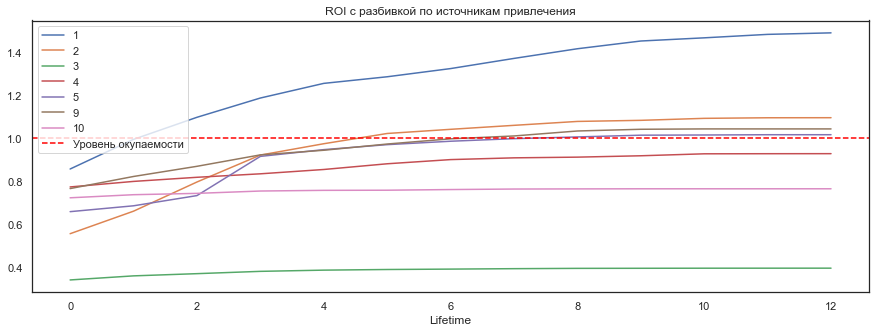

In [144]:
roi.T.plot(figsize=(15, 5))
plt.axhline(y = 1, label = 'Уровень окупаемости', color = 'red', linestyle = '--')
plt.title('ROI с разбивкой по источникам привлечения')
plt.xlabel('Lifetime')
plt.legend()
plt.show()

In [145]:
costs.pivot_table(index='source_id', values='costs', aggfunc='sum', margins=True)

,costs
source_id,
1,20833.27
2,42806.04
3,138472.17
4,61073.60
5,51757.10
9,5517.49
10,5822.49
All,326282.16


# Вывод:

    Видно, что 1-й источник пересек уровень окупаемости почти сразу, источники 2,5 и 9 задержались на полгода, остальные вообще не окупились.
    Если еще раз посмотреть на затраты по источникам, то видно, что 10 и 3 источники показывают низкую окупаемость. 4 источник тоже можно поставить под вопрос. 
    
 Самые дорогие источники: 3 и 4. 5, 2, 1 - средней стоимости.  9 и 10 самые дешевые. А за 6, 7, 8 источницки ничего не заплатили. Возможно, это разные браузеры, через которые пользователи заходили на сайт. 
    

# Посмотрим на окупаемость источников по устройствам ROI для устройств
<a id=section3_3_3 ></a> <>

In [146]:
# определяем устройство пользователя
# допустим, что первое использованное устройство более предпочтительное для пользователя

devices = visits.sort_values(by = ['user_id', 'ssn_start']).groupby('user_id').agg({'device': 'first'})

In [147]:
orders_device = devices.merge(orders, on = 'user_id')

In [150]:
costs['costs'].sum()

326282.16000000003

In [151]:
orders['revenue'].sum()

252053.77999999997

In [152]:
# смотрим LTV CAC ROI по дейвайсам

# соединяем первые покупки источники и устройства 
# 1st buy and source

device_payers = orders_device.groupby(['user_id', 'device']).agg({'order_date': 'min'}).merge(sources, on = 'user_id').reset_index()
device_payers = device_payers.rename(columns = {'order_date': 'first_buy'})
device_ltv = device_payers.merge(orders_device, on = 'user_id').reset_index()
device_ltv['lifetime'] = ((device_ltv['order_date'] - device_ltv['first_buy']) / np.timedelta64(1,'M')).round().astype(int)
orders_new = device_ltv.copy()

# считаем ltv
device_buyers_lifetime = device_ltv.pivot_table(index =('source_id', 'device'), columns = 'lifetime', values = 'user_id', aggfunc = 'nunique').fillna(0)
device_ltv = device_ltv.pivot_table(index = ('source_id', 'device'), columns = 'lifetime', values = 'revenue', aggfunc = 'sum', margins=True).fillna(0)
device_ltv = device_ltv.cumsum(axis = 1)
device_ltv



lifetime                   0          1          2          3          4  \
source_id device                                                           
1         desktop   13745.88   16031.91   17996.53   19839.31   21199.80   
          touch      4100.90    4698.36    4879.93    4911.64    4976.15   
2         desktop   18478.00   22387.41   27928.07   33238.34   35388.79   
          touch      5259.70    5852.51    6142.96    6216.91    6333.05   
3         desktop   39600.31   41907.65   43104.63   44437.70   45172.96   
          touch      7294.58    7622.13    7854.35    8012.64    8062.27   
4         desktop   36069.89   37321.82   37972.40   38853.80   39984.75   
          touch     11131.40   11458.53   11983.23   12093.74   12195.69   
5         desktop   28736.71   30006.02   32368.83   41768.43   43349.72   
          touch      5293.69    5440.44    5543.56    5617.07    5671.49   
7         desktop       1.22       1.22       1.22       1.22       1.22   
9         desktop    3434.80    3735.57    3984.17    4245.93    4349.82   
          touch       787.62     798.55     811.76     844.70     859.73   
10        desktop    3359.99    3419.57    3452.75    3509.53    3528.16   
          touch       845.14     869.69     872.74     879.57     879.57   
All                178139.83  191551.38  204897.13  224470.53  231953.17   

lifetime                   5          6          7          8          9  \
source_id device                                                           
1         desktop   21833.46   22624.45   23605.40   24543.08   25291.81   
          touch      4985.43    4990.92    4998.62    5001.37    5005.24   
2         desktop   37337.18   38158.61   38937.29   39709.63   39903.27   
          touch      6433.09    6442.68    6459.73    6469.15    6493.59   
3         desktop   45540.42   45765.47   46006.78   46181.93   46211.58   
          touch      8108.46    8139.09    8177.06    8197.59    8221.60   
4         desktop   40843.16   41979.21   42305.04   42474.47   42822.05   
          touch     12966.11   13022.34   13197.53   13226.97   13269.65   
5         desktop   44524.45   45291.87   45899.95   46308.72   46717.21   
          touch      5699.90    5756.35    5770.64    5778.64    5793.92   
7         desktop       1.22       1.22       1.22       1.22       1.22   
9         desktop    4506.90    4636.42    4705.57    4818.02    4860.91   
          touch       863.02     867.91     872.18     887.92     889.14   
10        desktop    3530.20    3548.15    3559.21    3562.50    3565.86   
          touch       881.04     881.04     884.10     884.47     884.47   
All                238054.04  242105.73  245380.32  248045.68  249931.52   

lifetime                  10         11         12        All  
source_id device                                               
1         desktop   25582.31   25880.55   25995.60   51991.20  
          touch      5024.06    5061.95    5094.95   10189.90  
2         desktop   40257.58   40374.78   40386.63   80773.26  
          touch      6536.98    6536.98    6536.98   13073.96  
3         desktop   46255.27   46265.93   46273.75   92547.50  
          touch      8232.60    8233.82    8237.49   16474.98  
4         desktop   43378.31   43398.10   43411.54   86823.08  
          touch     13273.32   13281.87   13281.87   26563.74  
5         desktop   46757.33   46823.57   46825.34   93650.68  
          touch      5798.68    5798.68    5798.68   11597.36  
7         desktop       1.22       1.22       1.22       2.44  
9         desktop    4866.41    4866.41    4866.41    9732.82  
          touch       892.99     892.99     892.99    1785.98  
10        desktop    3565.86    3565.86    3565.86    7131.72  
          touch       884.47     884.47     884.47    1768.94  
All                251307.39  251867.18  252053.78  504107.56

In [153]:
# добавляем размеры когорт и делим на них
# div(ltv['cohort_size'], axis = 0) берет столбец cohort_size и делит на него каждый столбец фрейма

device_cohort_sizes = orders_new.groupby(['source_id', 'device']).agg({'user_id': 'nunique'}).rename(columns = {'user_id': 'cohort_size'})

device_ltv = device_ltv.merge(device_cohort_sizes, on = ['source_id', 'device'])
device_ltv = device_ltv.div(device_ltv['cohort_size'], axis = 0).drop(columns = 'cohort_size')
display(device_ltv)


0         1          2          3          4  \
source_id device                                                         
1         desktop  6.071502  7.081232   7.948997   8.762946   9.363869   
          touch    6.458110  7.398992   7.684929   7.734866   7.836457   
2         desktop  6.975462  8.451268  10.542873  12.547505  13.359302   
          touch    6.137340  6.829067   7.167981   7.254271   7.389790   
3         desktop  4.539238  4.803720   4.940925   5.093730   5.178010   
          touch    4.170715  4.357993   4.490766   4.581269   4.609646   
4         desktop  4.547962  4.705815   4.787845   4.898979   5.041577   
          touch    4.708714  4.847094   5.069048   5.115795   5.158921   
5         desktop  5.037110  5.259600   5.673765   7.321372   7.598549   
          touch    4.317855  4.437553   4.521664   4.581623   4.626011   
7         desktop  1.220000  1.220000   1.220000   1.220000   1.220000   
9         desktop  3.850673  4.187859   4.466558   4.760011   4.876480   
          touch    4.018469  4.074235   4.141633   4.309694   4.386378   
10        desktop  3.218381  3.275450   3.307232   3.361619   3.379464   
          touch    2.965404  3.051544   3.062246   3.086211   3.086211   

                           5          6          7          8          9  \
source_id device                                                           
1         desktop   9.643754   9.993132  10.426413  10.840583  11.171294   
          touch     7.851071   7.859717   7.871843   7.876173   7.882268   
2         desktop  14.094821  14.404911  14.698864  14.990423  15.063522   
          touch     7.506523   7.517713   7.537608   7.548600   7.577118   
3         desktop   5.220131   5.245927   5.273588   5.293665   5.297063   
          touch     4.636055   4.653568   4.675277   4.687015   4.700743   
4         desktop   5.149812   5.293054   5.334137   5.355500   5.399325   
          touch     5.484818   5.508604   5.582712   5.595165   5.613219   
5         desktop   7.804461   7.938978   8.045565   8.117216   8.188819   
          touch     4.649184   4.695228   4.706884   4.713409   4.725873   
7         desktop   1.220000   1.220000   1.220000   1.220000   1.220000   
9         desktop   5.052578   5.197780   5.275303   5.401368   5.449451   
          touch     4.403163   4.428112   4.449898   4.530204   4.536429   
10        desktop   3.381418   3.398611   3.409205   3.412356   3.415575   
          touch     3.091368   3.091368   3.102105   3.103404   3.103404   

                          10         11         12        All  
source_id device                                               
1         desktop  11.299607  11.431338  11.482155  22.964311  
          touch     7.911906   7.971575   8.023543  16.047087  
2         desktop  15.197274  15.241518  15.245991  30.491982  
          touch     7.627748   7.627748   7.627748  15.255496  
3         desktop   5.302071   5.303293   5.304190  10.608379  
          touch     4.707033   4.707730   4.709828   9.419657  
4         desktop   5.469463   5.471958   5.473653  10.947306  
          touch     5.614772   5.618388   5.618388  11.236777  
5         desktop   8.195851   8.207462   8.207772  16.415544  
          touch     4.729755   4.729755   4.729755   9.459511  
7         desktop   1.220000   1.220000   1.220000   2.440000  
9         desktop   5.455617   5.455617   5.455617  10.911233  
          touch     4.556071   4.556071   4.556071   9.112143  
10        desktop   3.415575   3.415575   3.415575   6.831149  
          touch     3.103404   3.103404   3.103404   6.206807

In [154]:
# считаем САС
cac = costs.groupby('source_id').agg({'costs': 'sum'}).merge(cohort_sizes, on = 'source_id')
cac['cac'] = cac['costs'] / cac['cohort_size']
display(cac)

,costs,cohort_size,cac
source_id,,,
1,20833.27,2899,7.186364
2,42806.04,3506,12.209367
3,138472.17,10473,13.221825
4,61073.60,10295,5.932356
5,51757.10,6931,7.467479
9,5517.49,1088,5.071222
10,5822.49,1329,4.381106


In [155]:
ttl_costs = (costs.groupby('source_id')['costs'].sum()).reset_index()
ttl_costs

,source_id,costs
0,1,20833.27
1,2,42806.04
2,3,138472.17
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


In [156]:
orders_new = orders_new.merge(cohort_sizes, on = 'source_id')

In [157]:
orders_new = orders_new.merge(ttl_costs, on = 'source_id')

In [158]:
orders_new.head()

,index,user_id,first_buy,source_id,device,order_date,revenue,first_order_date,first_order_month,order_month,lifetime,cohort_size,costs
0,0,313578113262317,2018-01-03 21:51:00,2,desktop,2018-01-03 21:51:00,0.55,2018-01-03 21:51:00,2018-01-01,2018-01-01,0,3506,42806.04
1,8,3605148382144603,2017-09-21 20:56:00,2,desktop,2017-09-21 20:56:00,0.12,2017-09-21 20:56:00,2017-09-01,2017-09-01,0,3506,42806.04
2,9,3605148382144603,2017-09-21 20:56:00,2,desktop,2017-09-21 22:44:00,0.24,2017-09-21 20:56:00,2017-09-01,2017-09-01,0,3506,42806.04
3,10,3605148382144603,2017-09-21 20:56:00,2,desktop,2017-09-21 23:52:00,0.33,2017-09-21 20:56:00,2017-09-01,2017-09-01,0,3506,42806.04
4,15,6339315367323360,2018-02-17 14:49:00,2,desktop,2018-02-17 14:49:00,1.04,2018-02-17 14:49:00,2018-02-01,2018-02-01,0,3506,42806.04


In [159]:
piv_1 = orders_new.pivot_table(index=('source_id', 'device'),\
                       values=('costs', 'cohort_size'), fill_value=0)
piv_1

cohort_size      costs
source_id device                         
1         desktop         2899   20833.27
          touch           2899   20833.27
2         desktop         3506   42806.04
          touch           3506   42806.04
3         desktop        10473  138472.17
          touch          10473  138472.17
4         desktop        10295   61073.60
          touch          10295   61073.60
5         desktop         6931   51757.10
          touch           6931   51757.10
9         desktop         1088    5517.49
          touch           1088    5517.49
10        desktop         1329    5822.49
          touch           1329    5822.49

In [160]:
piv_2 = orders_new.pivot_table(index=('source_id', 'device'),\
                       values=('user_id', 'cohort_size', 'costs'), aggfunc=({'user_id':'nunique'}), fill_value=0)
piv_2 = piv_2.rename(columns={'user_id':'users'})
#piv.index.get_level_values(2)
piv_2

users
source_id device        
1         desktop   2264
          touch      635
2         desktop   2649
          touch      857
3         desktop   8724
          touch     1749
4         desktop   7931
          touch     2364
5         desktop   5705
          touch     1226
9         desktop    892
          touch      196
10        desktop   1044
          touch      285

In [161]:
device_cac = piv_2.merge(piv_1, on=('source_id', 'device'))
device_cac

users  cohort_size      costs
source_id device                                
1         desktop   2264         2899   20833.27
          touch      635         2899   20833.27
2         desktop   2649         3506   42806.04
          touch      857         3506   42806.04
3         desktop   8724        10473  138472.17
          touch     1749        10473  138472.17
4         desktop   7931        10295   61073.60
          touch     2364        10295   61073.60
5         desktop   5705         6931   51757.10
          touch     1226         6931   51757.10
9         desktop    892         1088    5517.49
          touch      196         1088    5517.49
10        desktop   1044         1329    5822.49
          touch      285         1329    5822.49

In [162]:
device_cac['part'] = device_cac['users'] / device_cac['cohort_size']
device_cac

users  cohort_size      costs      part
source_id device                                          
1         desktop   2264         2899   20833.27  0.780959
          touch      635         2899   20833.27  0.219041
2         desktop   2649         3506   42806.04  0.755562
          touch      857         3506   42806.04  0.244438
3         desktop   8724        10473  138472.17  0.832999
          touch     1749        10473  138472.17  0.167001
4         desktop   7931        10295   61073.60  0.770374
          touch     2364        10295   61073.60  0.229626
5         desktop   5705         6931   51757.10  0.823114
          touch     1226         6931   51757.10  0.176886
9         desktop    892         1088    5517.49  0.819853
          touch      196         1088    5517.49  0.180147
10        desktop   1044         1329    5822.49  0.785553
          touch      285         1329    5822.49  0.214447

In [163]:
device_cac['device_cost'] = device_cac['part'] * device_cac['costs']
device_cac['cac'] = device_cac['device_cost'] / device_cac['users']
device_cac

users  cohort_size      costs      part    device_cost  \
source_id device                                                            
1         desktop   2264         2899   20833.27  0.780959   16269.928693   
          touch      635         2899   20833.27  0.219041    4563.341307   
2         desktop   2649         3506   42806.04  0.755562   32342.612653   
          touch      857         3506   42806.04  0.244438   10463.427347   
3         desktop   8724        10473  138472.17  0.832999  115347.198614   
          touch     1749        10473  138472.17  0.167001   23124.971386   
4         desktop   7931        10295   61073.60  0.770374   47049.511569   
          touch     2364        10295   61073.60  0.229626   14024.088431   
5         desktop   5705         6931   51757.10  0.823114   42601.970206   
          touch     1226         6931   51757.10  0.176886    9155.129794   
9         desktop    892         1088    5517.49  0.819853    4523.530404   
          touch      196         1088    5517.49  0.180147     993.959596   
10        desktop   1044         1329    5822.49  0.785553    4573.874763   
          touch      285         1329    5822.49  0.214447    1248.615237   

                         cac  
source_id device              
1         desktop   7.186364  
          touch     7.186364  
2         desktop  12.209367  
          touch    12.209367  
3         desktop  13.221825  
          touch    13.221825  
4         desktop   5.932356  
          touch     5.932356  
5         desktop   7.467479  
          touch     7.467479  
9         desktop   5.071222  
          touch     5.071222  
10        desktop   4.381106  
          touch     4.381106

In [164]:
# считаем ROI
device_roi = device_ltv.merge(device_cac[['cac']], on = ('source_id', 'device'))
device_roi = device_roi.div(device_roi['cac'], axis = 0).drop(columns = 'cac')
device_roi

0         1         2         3         4         5  \
source_id device                                                                
1         desktop  0.844864  0.985371  1.106122  1.219385  1.303005  1.341952   
          touch    0.898662  1.029588  1.069377  1.076325  1.090462  1.092496   
2         desktop  0.571321  0.692195  0.863507  1.027695  1.094185  1.154427   
          touch    0.502675  0.559330  0.587089  0.594156  0.605256  0.614817   
3         desktop  0.343314  0.363317  0.373695  0.385252  0.391626  0.394812   
          touch    0.315442  0.329606  0.339648  0.346493  0.348639  0.350637   
4         desktop  0.766637  0.793246  0.807073  0.825807  0.849844  0.868089   
          touch    0.793734  0.817061  0.854475  0.862355  0.869624  0.924560   
5         desktop  0.674539  0.704334  0.759797  0.980434  1.017552  1.045127   
          touch    0.578221  0.594250  0.605514  0.613543  0.619488  0.622591   
9         desktop  0.759318  0.825809  0.880766  0.938632  0.961598  0.996324   
          touch    0.792406  0.803403  0.816693  0.849833  0.864955  0.868265   
10        desktop  0.734605  0.747631  0.754885  0.767299  0.771372  0.771818   
          touch    0.676862  0.696524  0.698966  0.704436  0.704436  0.705614   

                          6         7         8         9        10        11  \
source_id device                                                                
1         desktop  1.390568  1.450861  1.508493  1.554513  1.572368  1.590698   
          touch    1.093699  1.095386  1.095989  1.096837  1.100961  1.109264   
2         desktop  1.179825  1.203901  1.227781  1.233768  1.244723  1.248346   
          touch    0.615733  0.617363  0.618263  0.620599  0.624746  0.624746   
3         desktop  0.396763  0.398855  0.400373  0.400630  0.401009  0.401101   
          touch    0.351961  0.353603  0.354491  0.355529  0.356005  0.356058   
4         desktop  0.892235  0.899160  0.902761  0.910149  0.921972  0.922392   
          touch    0.928569  0.941062  0.943161  0.946204  0.946466  0.947075   
5         desktop  1.063140  1.077414  1.087009  1.096597  1.097539  1.099094   
          touch    0.628757  0.630318  0.631191  0.632860  0.633380  0.633380   
9         desktop  1.024956  1.040243  1.065102  1.074583  1.075799  1.075799   
          touch    0.873184  0.877480  0.893316  0.894543  0.898417  0.898417   
10        desktop  0.775743  0.778161  0.778880  0.779615  0.779615  0.779615   
          touch    0.705614  0.708064  0.708361  0.708361  0.708361  0.708361   

                         12       All  
source_id device                       
1         desktop  1.597770  3.195540  
          touch    1.116495  2.232991  
2         desktop  1.248713  2.497425  
          touch    0.624746  1.249491  
3         desktop  0.401169  0.802339  
          touch    0.356216  0.712432  
4         desktop  0.922678  1.845356  
          touch    0.947075  1.894151  
5         desktop  1.099136  2.198271  
          touch    0.633380  1.266761  
9         desktop  1.075799  2.151598  
          touch    0.898417  1.796834  
10        desktop  0.779615  1.559229  
          touch    0.708361  1.416721

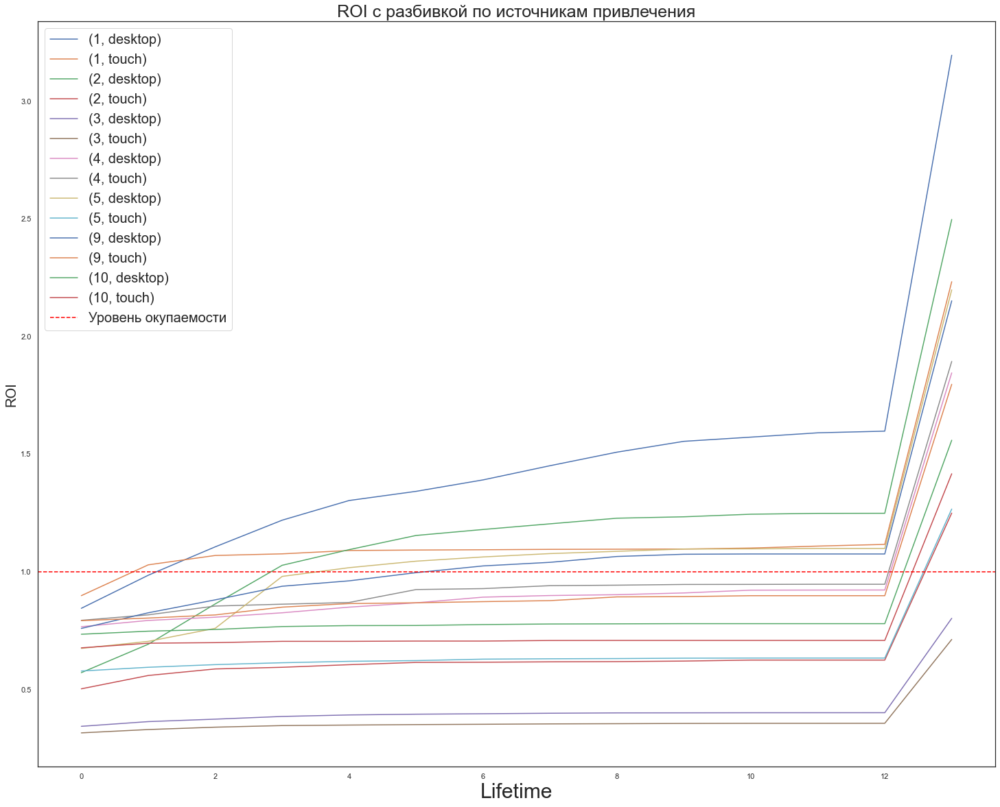

In [165]:
device_roi.T.plot(figsize=(25, 20))
plt.axhline(y = 1, label = 'Уровень окупаемости', color = 'red', linestyle = '--')
plt.title('ROI с разбивкой по источникам привлечения', fontsize = 25)
plt.xlabel('Lifetime', fontsize = 30)
plt.ylabel('ROI', fontsize = 20)
plt.legend(fontsize = 20)
plt.show()


# Вывод:
    В целом маркетинг для компьютерной версии сайта быстрее окупается. Не все источники одинаково хороши для 2 версий сайта: 2 и 3 источники слабо окупаются мобильной версией. 

# Воронки
<a id=section3_3_4 ></a> <>

In [166]:
# всего посетителей: users
visits['user_id'].shape[0]

359400

In [167]:
visits.groupby('device')['user_id'].count()

device
desktop    262567
touch       96833
Name: user_id, dtype: int64

In [168]:
# уникальных посетителей: unique_users
visits['user_id'].nunique()

228169

In [169]:
visits.groupby('device')['user_id'].nunique()

device
desktop    164523
touch       71345
Name: user_id, dtype: int64

In [170]:
# покупок  purchases
orders.shape[0]

50414

In [171]:
orders_device.groupby('device')['user_id'].count()

device
desktop    40926
touch       9488
Name: user_id, dtype: int64

In [172]:
# уникальных покупателей unique_payers
orders['user_id'].nunique()

36522

In [173]:
orders_device.groupby('device')['user_id'].nunique()

device
desktop    29210
touch       7312
Name: user_id, dtype: int64

In [174]:
# повторных покупок

#quantity of purchases
purchase = orders.groupby('user_id')['order_date'].count().reset_index()
purchase.query('order_date > 1').shape[0]

6292

In [175]:
purchase = orders_device.groupby(['device', 'user_id'])['order_date'].count().reset_index()
purchase = purchase.query('order_date > 1')
purchase.groupby('device')['user_id'].count()

device
desktop    5002
touch      1290
Name: user_id, dtype: int64

Воронка конверсии пользователей разных устройств в повторные покупки
<a id=section3_3_4_1></a>

In [176]:
steps=['users', 'unique_users', 'purchases', 'unique_payers', 'repeated_purchases']
desktop_figures = [262567, 164523, 40926, 29210, 5002]
touch_figures = [96833, 71345, 9488, 7312, 1290]
fig = go.Figure(data=[
    go.Bar(name='Desktop', x=steps, y=desktop_figures,
            text=desktop_figures,
            textposition='auto'),
    go.Bar(name='Touch', x=steps, y=touch_figures,
            text=touch_figures,
            textposition='auto')
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.update_layout(title_text='Воронка конверсии пользователей разных устройств в повторные покупки')
fig.show()

# Вывод:
    62% сессий за год было совершено новыми пользователями и 38% сессий составили повторные заходы знакомых с продуктом пользователей. 25% пользователей совершают покупки с компьютера и только 13% пользователей с мобильной версией. Похоже, что клиенты более склонны делать заказы с десктопной версии сайта. Поэтому и затраты на маркетинг там быстрее окупаются. 

In [177]:
steps=['users', 'purchases', 'repeated_purchases']
total_figures = [359400, 50414, 6292]
unique_figures = [228169, 36522, 6292]

fig = go.Figure(data=[
    go.Bar(name='Total', x=steps, y=total_figures,
            text=total_figures,
            textposition='auto'),
    go.Bar(name='Unique', x=steps, y=unique_figures,
            text=unique_figures,
            textposition='auto')
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.update_layout(title_text='Воронка конверсии пользователей в повторные покупки')
fig.show()

# Вывод: 
    16% пришедших на сайт совершают покупки и только 2.7% людей совершают повторные покупки. 

# 4 Общий вывод
<a id='section4'></a>
[Table of content](#table_of_content)

<i>(Изучаемый период не включает июнь 2018 года за неимением полных данных)</i>

+ За изученный период было выявлено несколько дат со значительным всплеском активности на сайте. Такие даты можно использовать для продвижения продукта. Например, черная пятница, школьные каникулы, начало лета провоцировали повышенный интерес к сайту. 

+ Настоящая тактика по привлечению пользователей работает, это видно по метрике <b>Retention Rate</b> (лояльность клиента), которая показывает рост интереса к нашему ресурсу. 50% пользователей вернулись за последние 2 недели до конца изучаемого периода. 

+ Однако, мы имеем недостаточно высокие <b>Sticky Factor</b> и <b>ASL</b>, сейчас средняя продолжительность сессии всего 60 сек, а ежемесячный Sticky Factor всего 3%. Я бы старалась увеличить продолжительность сессий и необходимость сайта для пользователя. 

+ Если есть задача работать на удержание клиентов, и на поддержание лояльности, то пользовательские когорты <b>июня 2017 года и октября 2017</b> продолжают составлять сравнительно большую долю покупателей, можно обратить на этих пользователей внимание. Средний чек колебался от 7,5 до 20 на конец изучаемого периода и составлял 11 у.е. [Heatmap](#heatmap3_2_5)

+ В целом, пользователи больше проводят времени на сайте и чаще покупают, когда используют компьютерную версию сайта. 
См. Воронки конверсий. [Воронка конверсии пользователей разных устройств в повторные покупки](#section3_3_4_1)
При чем, если пользователь заходит на сайт впервые, то в 16% случаев он сделает покупку. 

+ Маркетинговые затраты на 6 месяце окупились. <b>LTV(9 y.e.) > CAC(6 y.e.)</b>.

+ <b>ROI</b> с разбивкой на устройства показал, что маркетинговые затраты быстрее окупаются именно для десктопной версии. Если есть возможность, я бы скорректировала расходы на рекламу отталкиваясь именно от версии сайта, на которую направлено продвижение. Это еще обусловлено тем, что люди в 80 % случаев делают заказы с компьютера. 

+ Важно отметить, что из всех посетителей лишь 16 % делают заказ. Из них 25% пользователей совершают покупки с компьютера и только 13% пользователей с мобильной версии.

+ Повторные покупки совершают только 2.7% людей.

<b><i>Источники трафика</i></b>

Продуктивные: <br>
<br>
1, 2, 5 и 9 источники привлекают наиболее платежеспособных клиентов. ( видно по LTV с разбивкой на источники) [LTV graph](#section3_2_6)
<br>
1-й источник пересек уровень окупаемости почти сразу, источники 2,5 и 9 задержались на полгода, остальные вообще не окупились.
Если еще раз посмотреть на затраты по источникам, то видно, что 10 и 3 источники показывают низкую окупаемость. 3 источник нужно поставить под вопрос, тк он самый дорогой и наименее продуктивный, судя по ROI. [ROI](section3_3_2)
<br>
НЕ оправдавшие уровень затрат ресурсы: 3, 10 источники. 
<br>
<b>Также, не все источники одинаково хороши для 2 версий сайта. </b>
Ресурсы действенные для мобильной версии: 1, 4 
Ресурсы действенные для компьютерной версии: 1, 2, 4, 5, 9


